# Juan Sevilla Fernández 

# Práctica final análisis predictivo

In [1]:
from distutils.command.install import install
import pandas as pd
import datetime 
from datetime import timedelta
import matplotlib.pyplot as plt
import warnings
import  scipy.signal.signaltools
import seaborn as sns
from sktime.forecasting.base import ForecastingHorizon
from sktime.utils.plotting import plot_series
from sktime.forecasting.model_selection import temporal_train_test_split
import numpy as np
from sktime.forecasting.ets import AutoETS
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error
from sktime.performance_metrics.forecasting import MeanSquaredError
from sktime.transformations.series.boxcox import LogTransformer
from sktime.forecasting.arima import AutoARIMA
from IPython.display import display_html
from itertools import chain,cycle
from darts.models import Theta, FourTheta, TBATS
from darts.metrics import mape
from darts import TimeSeries
from darts.utils.utils import SeasonalityMode, TrendMode, ModelMode
mse=MeanSquaredError()
rmse = MeanSquaredError(square_root=True)
from darts.metrics import mape as mape_theta,mae as mae_theta,rmse as rmse_theta,mse as mse_theta
import matplotlib.dates as mdates

def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2 style="text-align: center;">{title}</h2>'
        html_str+=df.to_html().replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)

def _centered(arr, newsize):
    # Return the center newsize portion of the array.
    newsize = np.asarray(newsize)
    currsize = np.array(arr.shape)
    startind = (currsize - newsize) // 2
    endind = startind + newsize
    myslice = [slice(startind[k], endind[k]) for k in range(len(endind))]
    return arr[tuple(myslice)]

scipy.signal.signaltools._centered = _centered
import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore")

In [2]:
patron_JS= "/Users/juan/Documents/Juan's MacBook Pro/CUNEF/Quinto/Analisis Predictivo/datos.csv"

datos=pd.read_csv(patron_JS,parse_dates=['Date'])
#datos['Date'] = pd.to_datetime(datos['Date'], utc=True)
datos=datos.set_index('Date')
print(datos.shape)
datos.head()

(9236, 8)


,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2015-07-31,T1a,5,11075,915,1,1,0,1
2015-07-31,T1b,5,12602,1414,1,1,0,1
2015-07-31,T1c,5,5425,453,1,1,0,1
2015-07-31,T2a,5,10483,1223,1,1,0,1
2015-07-31,T2b,5,6456,595,1,1,0,1


# Exploración inicial de los datos

#### Exploración de NAs

In [3]:
datos.isna().sum()

Store            0
DayOfWeek        0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

#### Exploración de tiendas

In [16]:
print('El número de días con ventas de 0 es de:' , len(datos[datos['Sales'] == 0]))
print(' ')
print('Los días sin ventas representan un', round(len(datos[datos['Sales'] == 0])/len(datos)*100,2), '% del total de los días')
print(' ')
print('De esos días,' , len(datos[(datos['Open'] == 0) & (datos['Sales'] == 0)]), 'pertenecen a tiendas cerradas.')
print(' ')
print('Por lo tanto, el número de días con tiendas abiertas con ventas de 0:' , len(datos[(datos['Open'] == 1) & (datos['Sales'] == 0)]))

El número de días con ventas de 0 es de: 1765
 
Los días sin ventas representan un 19.11 % del total de los días
 
De esos días, 1763 pertenecen a tiendas cerradas.
 
Por lo tanto, el número de días con tiendas abiertas con ventas de 0: 2


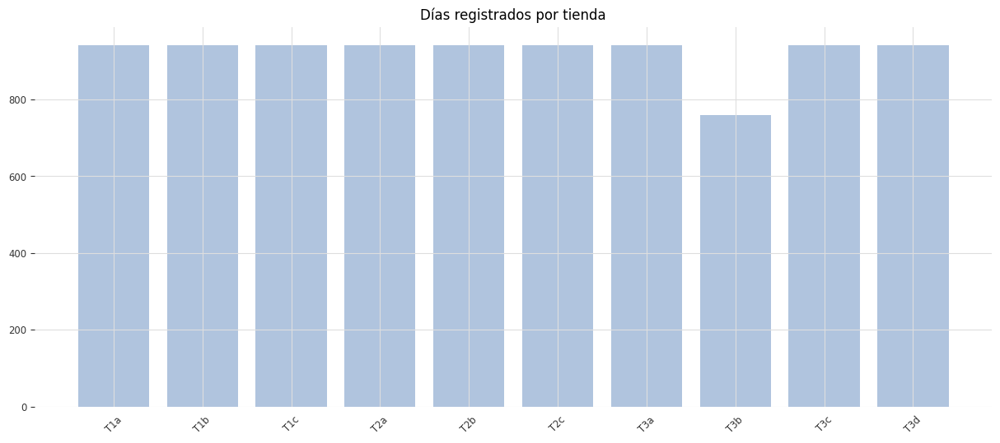

In [5]:
tiendas = datos.copy()
tiendas = pd.DataFrame(tiendas.groupby(tiendas['Store'])['Store'].count())
tiendas.rename(columns = {'Store':'veces'}, inplace = True)
tiendas = tiendas.reset_index()

plt.figure(figsize=(15, 6))
plt.bar(tiendas['Store'], tiendas['veces'], color = ['lightsteelblue'])
plt.xticks(rotation = 45)
plt.title('Días registrados por tienda');

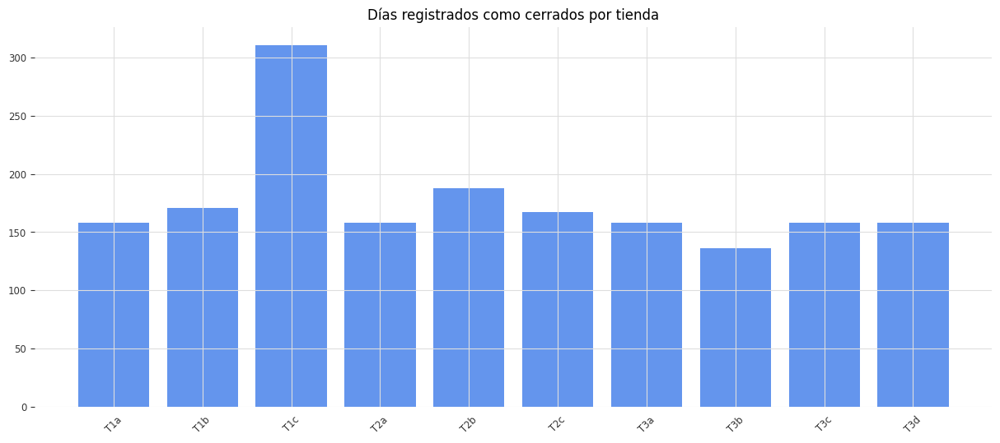

In [6]:
tiendas_0 = datos.copy()
tiendas_0 = tiendas_0[tiendas_0['Open'] == 0]
tiendas_0 = pd.DataFrame(tiendas_0.groupby(tiendas_0['Store'])['Store'].count())
tiendas_0.rename(columns = {'Store':'veces'}, inplace = True)
tiendas_0 = tiendas_0.reset_index()


plt.figure(figsize=(15, 6))
plt.bar(tiendas_0['Store'], tiendas_0['veces'], color = ['cornflowerblue'])
plt.xticks(rotation = 45)
plt.title('Días registrados como cerrados por tienda');

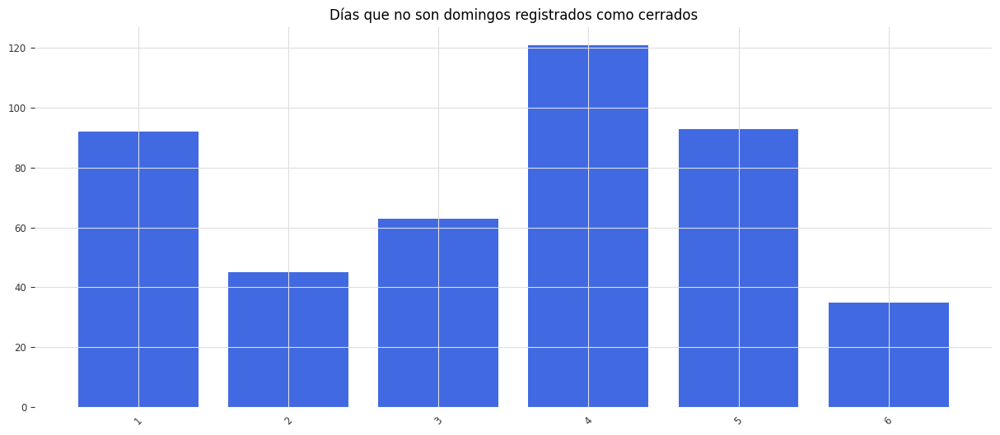

In [7]:
tiendas_cerradas_no_domingos = datos.copy()
tiendas_cerradas_no_domingos = tiendas_cerradas_no_domingos[(tiendas_cerradas_no_domingos['Open'] == 0) & (tiendas_cerradas_no_domingos['DayOfWeek'] != 7)]
tiendas_cerradas_no_domingos = pd.DataFrame(tiendas_cerradas_no_domingos.groupby(tiendas_cerradas_no_domingos['DayOfWeek'])['Store'].count())

tiendas_cerradas_no_domingos.rename(columns = {'Store':'veces'}, inplace = True)
tiendas_cerradas_no_domingos = tiendas_cerradas_no_domingos.reset_index()


plt.figure(figsize=(15, 6))
plt.bar(tiendas_cerradas_no_domingos['DayOfWeek'], tiendas_cerradas_no_domingos['veces'], color = ['royalblue'])
plt.xticks(rotation = 45)
plt.title('Días que no son domingos registrados como cerrados');

#### Exploración de ventas por día de la semana

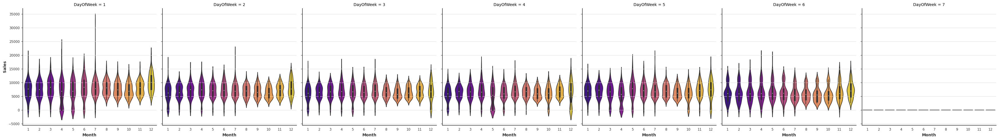

In [8]:
warnings.filterwarnings('ignore')
datos_semana = datos.copy()
datos_semana['Month'] = datos_semana.index.month

sns.catplot(data = datos_semana, x = 'Month', y = "Sales", 
               col = 'DayOfWeek', 
               palette = 'plasma',kind = 'violin');

#### Exploración de ventas por mes

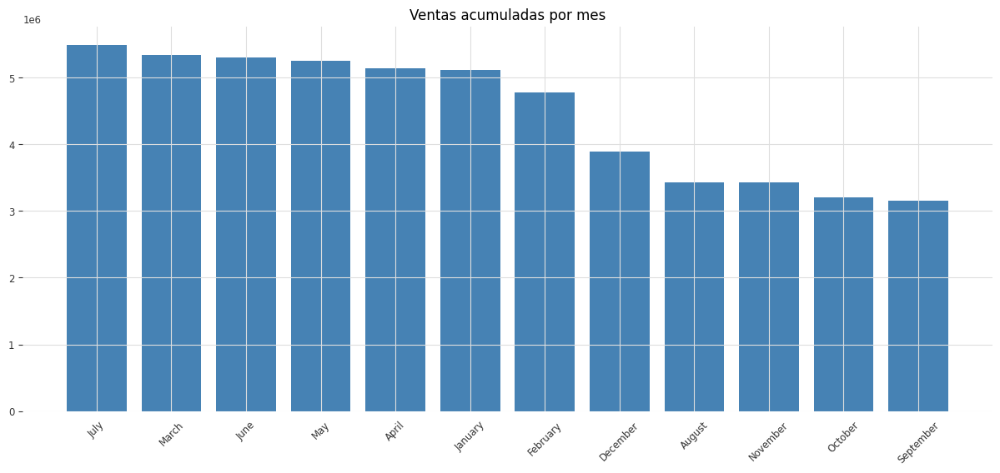

In [9]:
datos_mes = datos.copy()
datos_mes = datos_mes.reset_index()
datos_mes = pd.DataFrame(datos_mes.groupby(datos_mes['Date'].dt.strftime('%B'))['Sales'].sum())
datos_mes = datos_mes.reset_index()

datos_mes = datos_mes.sort_values(by="Sales", ascending = False)

plt.figure(figsize=(15, 6))
plt.bar(datos_mes['Date'], datos_mes['Sales'], color = 'steelblue')
plt.xticks(rotation = 45)
plt.title('Ventas acumuladas por mes');

#### Exploración de las correlaciones

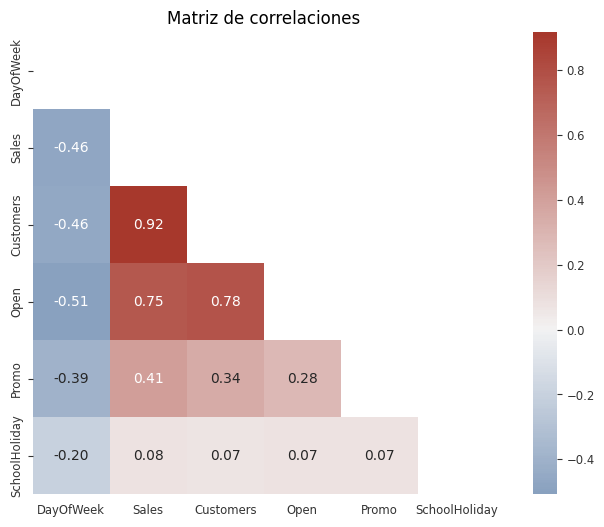

In [10]:
corr = datos.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(250, 15, s=75, l=40,
                            n=9, center="light", as_cmap=True)

plt.figure(figsize=(10, 6))
sns.heatmap(corr, mask=mask, center=0, annot=True,
            fmt='.2f', square=True, cmap=cmap)

plt.title('Matriz de correlaciones')
plt.show();

# 1. Graficar las ventas diarias de las 10 tiendas.

In [11]:
datos_tienda = datos[['Store','Sales']]
datos_tienda = datos_tienda.reset_index()

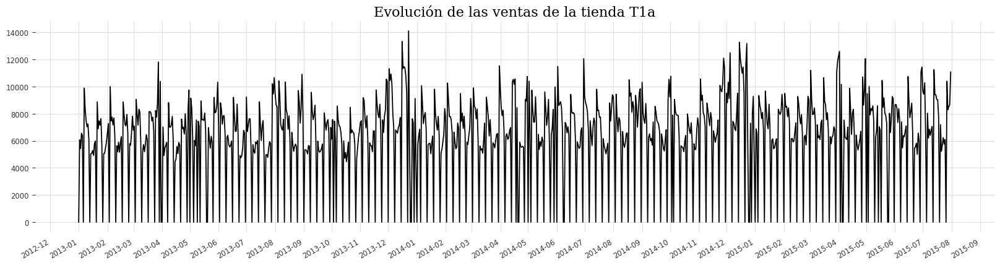

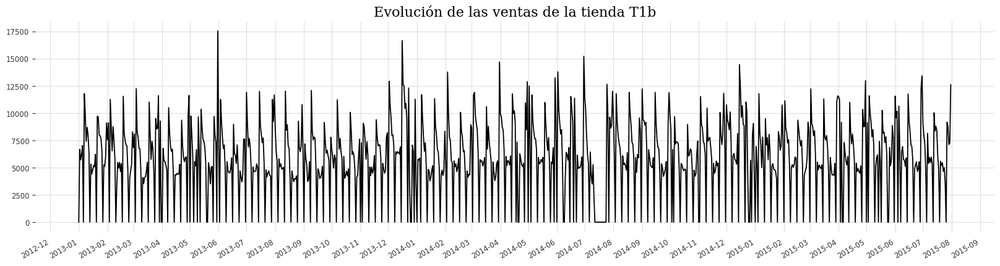

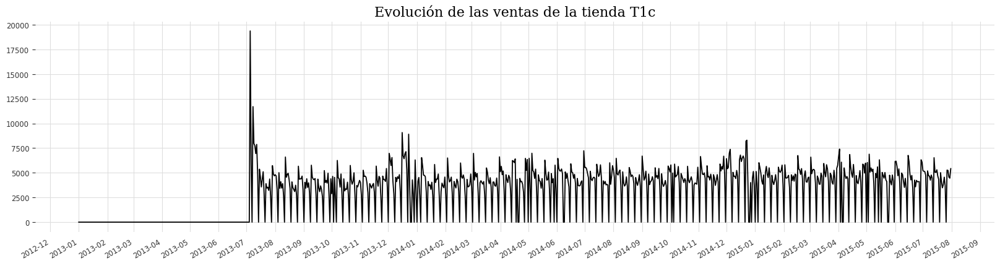

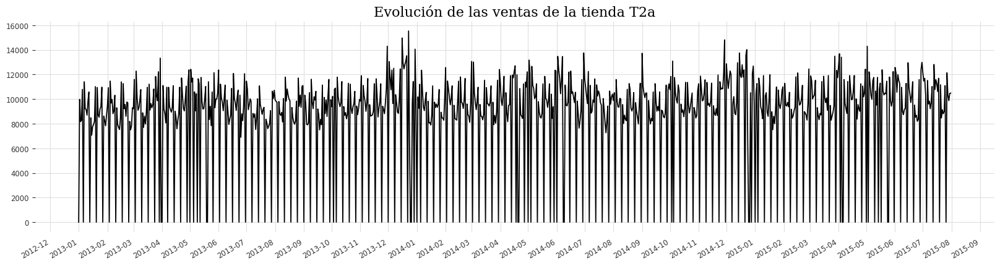

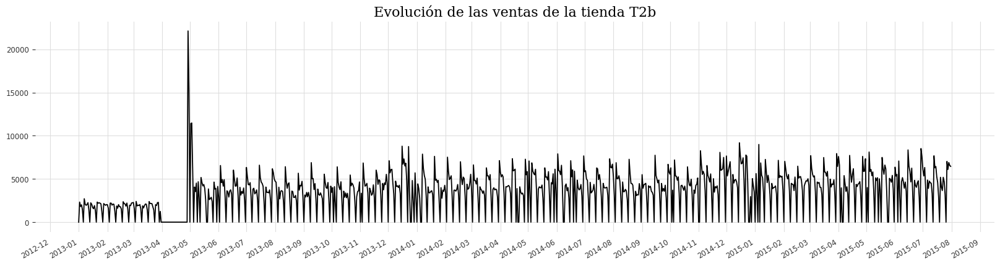

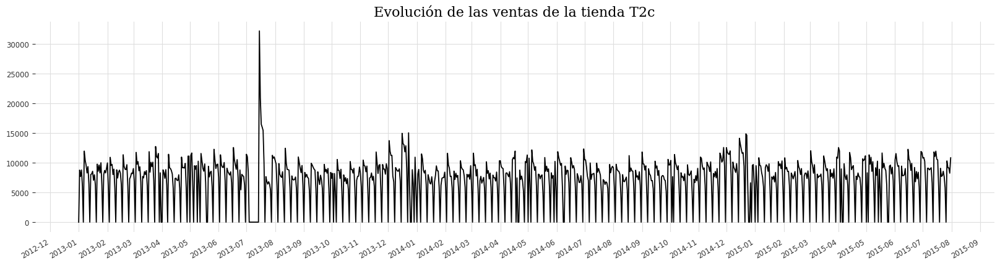

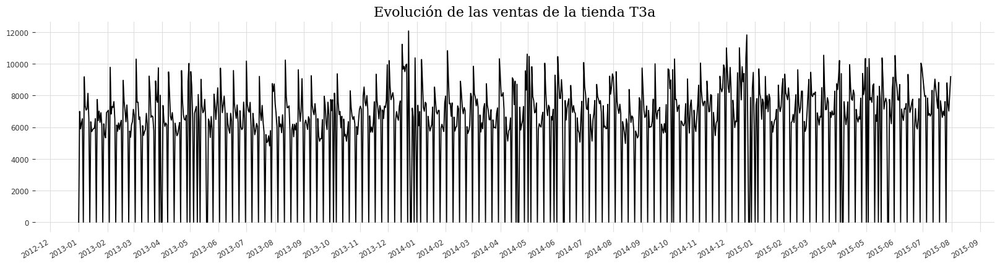

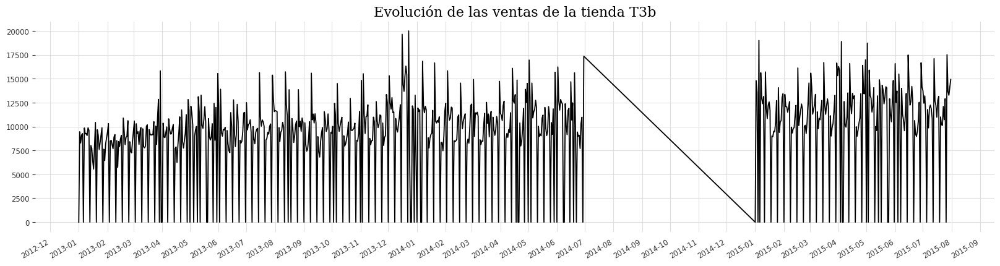

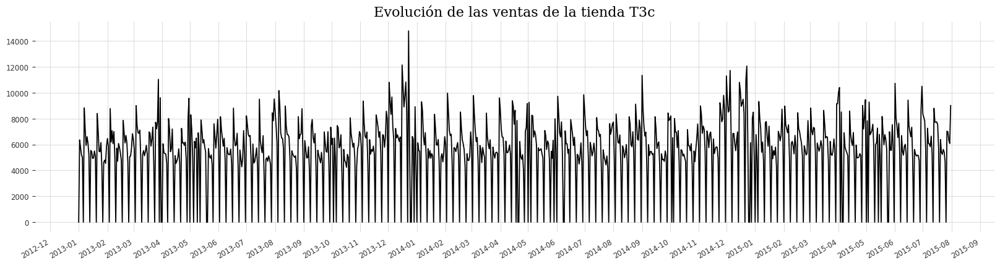

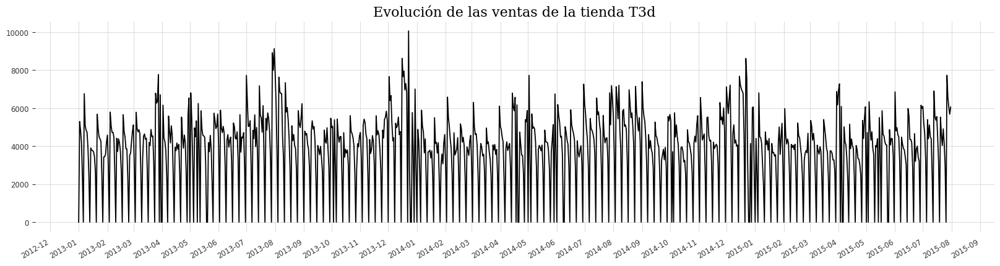

In [12]:
font = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 16,
        }

for store in sorted(datos_tienda["Store"].unique()):
    datosT1a = datos_tienda[(datos_tienda['Store'] == store)]
    date_T1a = datosT1a["Date"]
    value_T1a = datosT1a["Sales"]

    fig, ax = plt.subplots(figsize=(20, 5))

    half_year_locator = mdates.MonthLocator(interval=1)
    year_month_formatter = mdates.DateFormatter("%Y-%m") 

    ax.xaxis.set_major_locator(half_year_locator)
    ax.xaxis.set_major_formatter(year_month_formatter) 

    ax.axes.set_title(str('Evolución de las ventas de la tienda '+store),fontdict=font)

    ax.plot(date_T1a, value_T1a)
    fig.autofmt_xdate();

# 2. Graficar las ventas diarias de las 3 zonas.

In [13]:
# =======================================
# Extraccion de zona de cada tienda
# =======================================

datos_zona = datos.copy()
datos_zona = datos_zona[['Store','Sales']]
datos_zona['Zona'] = datos_zona.Store.str[-2]
datos_zona = datos_zona[['Sales','Zona']]
datos_zona = datos_zona.reset_index()

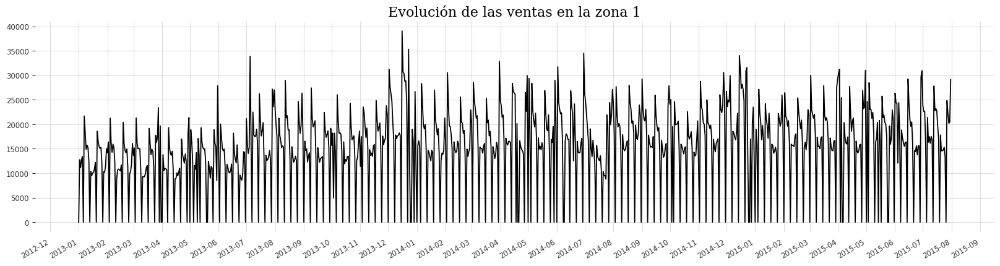

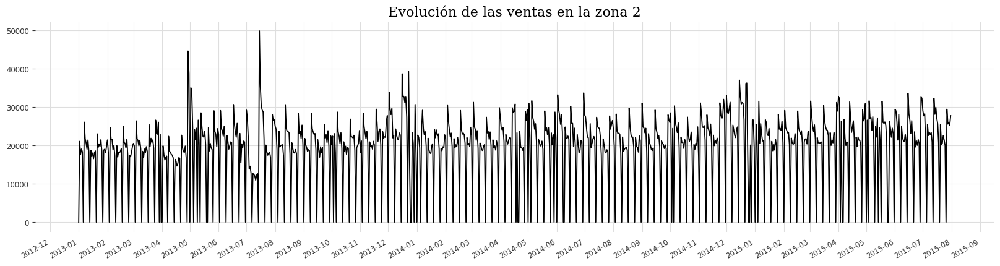

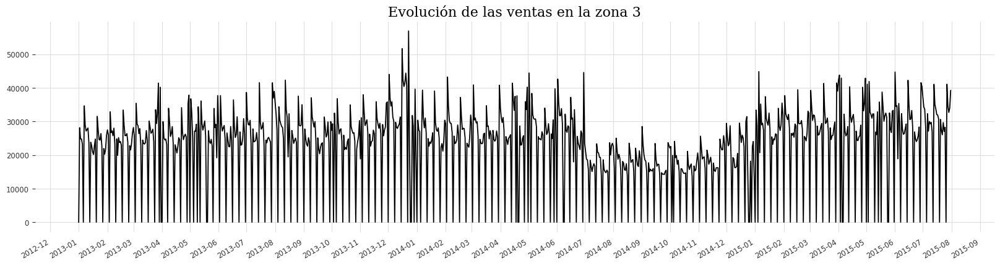

In [14]:
for zona in sorted(datos_zona["Zona"].unique()):
    zona_a = datos_zona[datos_zona.Zona == zona]

    zona_a_group = zona_a.groupby("Date").agg({"Sales":"sum"}).reset_index()

    date_a = zona_a_group["Date"]
    value_a = zona_a_group["Sales"]

    fig, ax = plt.subplots(figsize=(20, 5))

    half_year_locator = mdates.MonthLocator(interval=1)
    year_month_formatter = mdates.DateFormatter("%Y-%m") 

    ax.xaxis.set_major_locator(half_year_locator)
    ax.xaxis.set_major_formatter(year_month_formatter) 

    ax.axes.set_title(str('Evolución de las ventas en la zona ' + zona),fontdict=font)

    ax.plot(date_a, value_a)
    fig.autofmt_xdate();

# 3. Graficar las ventas totales diarias.

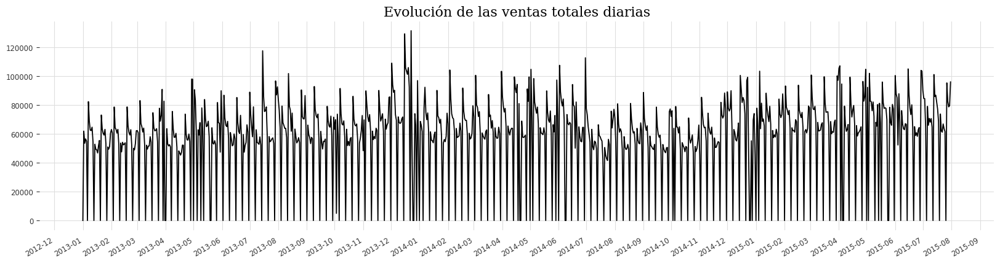

In [143]:
datos_tot = datos.copy()
datos_tot = datos_tot.reset_index()

total_group = datos_tot.groupby("Date").agg({"Sales":"sum"}).reset_index()

date_total = total_group["Date"]
value_total = total_group["Sales"]

fig, ax = plt.subplots(figsize=(20, 5))

half_year_locator = mdates.MonthLocator(interval=1)
year_month_formatter = mdates.DateFormatter("%Y-%m")

ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) 

ax.axes.set_title('Evolución de las ventas totales diarias',fontdict=font)

ax.plot(date_total, value_total)
fig.autofmt_xdate();

# 4. Graficar las ventas totales semanales.

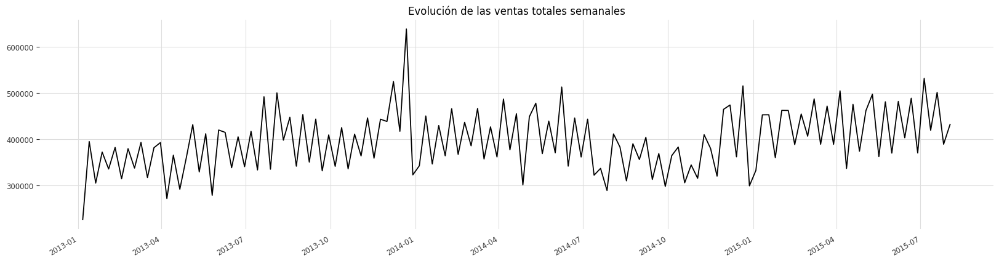

In [18]:
datos_semanales = datos.copy()
datos_semanales = datos_semanales.resample('w').sum()
datos_semanales = datos_semanales.reset_index()

date_semanal = datos_semanales["Date"]
value_semanal = datos_semanales["Sales"]

fig, ax = plt.subplots(figsize=(20, 5))

ax.axes.set_title('Evolución de las ventas totales semanales')

ax.plot(date_semanal, value_semanal)
fig.autofmt_xdate();

In [19]:
# La gente hace la compra cada dos semanas. Está sincronizado cuando la gente cobra
# Estacionalidad en meses y cada dos semanas, probar sp=14 en modelos

# Tratamiento de los datos

In [21]:
####################
# Tratamiento T3b
####################

from datetime import datetime, timedelta
datos_sin_NA = datos.copy()

datos_t3b = datos.copy()[datos.Store == "T3b"]
datos_t3b_2013=datos_t3b.query("20130630 < index < 20140101")
datos_t3b_2013['Date']=pd.date_range(datetime(2014,7,1), datetime(2014,12,31))
datos_t3b_2013['DayOfWeek']+=1
datos_t3b_2013=datos_t3b_2013.set_index('Date')
datos_t3b_2013.loc[datos_t3b_2013['DayOfWeek'] == 8, 'DayOfWeek'] = 1
datos_sin_NA = datos_sin_NA.append(datos_t3b_2013).sort_index()

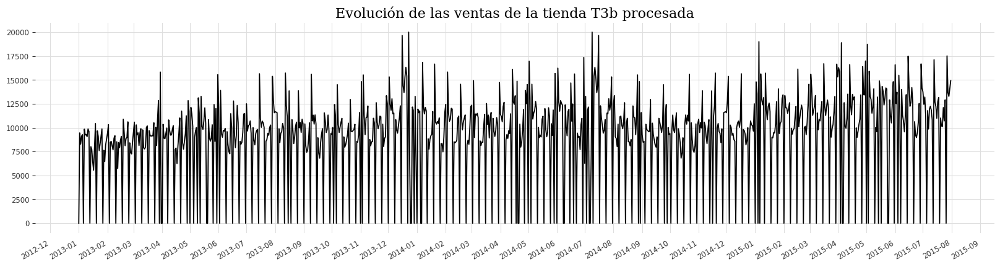

In [23]:
datos_tienda_proc = datos_sin_NA[['Store','Sales','Customers']]
datos_tienda_proc = datos_tienda_proc.reset_index()

datosT3b_proc = datos_tienda_proc[(datos_tienda_proc['Store'] == 'T3b')]
date_T3b = datosT3b_proc["Date"]
value_T3b = datosT3b_proc["Sales"]

fig, ax = plt.subplots(figsize=(20, 5))

half_year_locator = mdates.MonthLocator(interval=1)
year_month_formatter = mdates.DateFormatter("%Y-%m") 

ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) 

ax.axes.set_title('Evolución de las ventas de la tienda T3b procesada',fontdict=font)

ax.plot(date_T3b, value_T3b)
fig.autofmt_xdate();

In [91]:
data = datos.copy()
data = data[(data['Open'] == 1) | (data['DayOfWeek'] == 7)]
faltantes = pd.DataFrame()

for store in datos["Store"].unique():
    if store == "T3b":
        data_store = datosT3b_proc
        data_store = data_store.set_index("Date")
    else:
        data_store = data[data['Store'] == store]
    data_store = data_store.resample('d').last()
    data_store['Store'] = store
    if store == "T1c":
        data_store.loc['2013-01-02':'2013-07-04', 'Sales'] = 0
    data_store = data_store.reset_index()
    faltantes = pd.concat([faltantes,data_store], ignore_index=False)

faltantes = faltantes.sort_values(['Date','Store'])

faltantes_zona = faltantes.copy()
faltantes_zona["Zona"] = faltantes.Store.str[-2]

# puesto que los domingos hemos visto que no hay ventas porque cierran. No tiene sentido reemplazar los valores. Decidimos reemplazarlos para el resto de missing data
# al habernos filtrado por domingos y abierto, el primero día para el T1C es domingo y por eso los 0
# no hay T1C porque esta abre más tarde

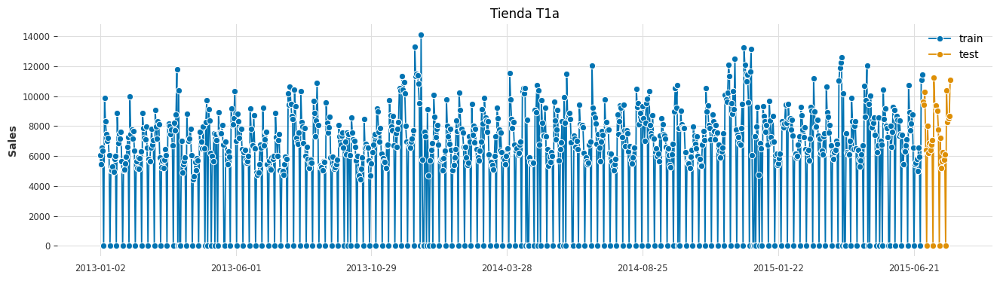

In [64]:
from sktime.utils.plotting import plot_series

data_t1a = faltantes[faltantes['Store'] == 'T1a']
data_t1a = data_t1a[(['Date','Sales'])]
data_t1a = data_t1a.fillna(1)
data_t1a = data_t1a.set_index('Date')

data_t1a_train = data_t1a.loc[:'2015-06-30']['Sales'].to_period('d')
data_t1a_test = data_t1a.loc['2015-07-01':]['Sales'].to_period('d')

plot_series(data_t1a_train, data_t1a_test, labels=["train", "test"])
plt.title('Tienda T1a');

# 5. Predecir las ventas totales diarias.

## Tienda T1a

#### ETS T1a

In [65]:
from sktime.forecasting.ets import AutoETS

fh_ets = np.arange(1, 32)
ETS = AutoETS(auto=True, sp=14, n_jobs=-1)
ETS.fit(data_t1a_train)

ETS_pred = ETS.predict(fh_ets)
ETS_ints_pred = ETS.predict_interval(fh_ets, coverage=0.9)

#destacar que hemos puesto sp de 14 ya que vemos ciclos bisemanales. Esto quiere decir que hay mas ventas cada dos semanas

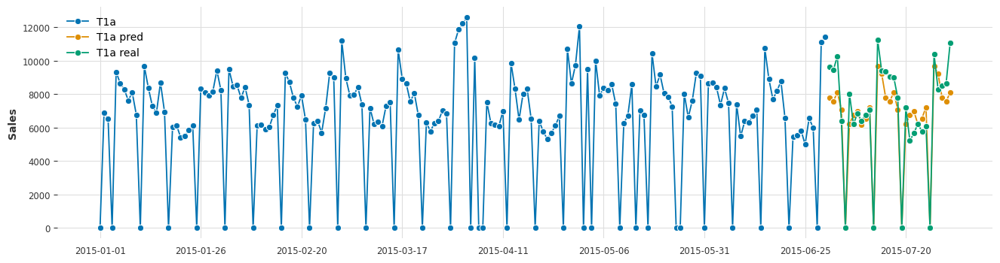

In [66]:
fig, ax = plot_series(data_t1a_train['2015-01-01':], ETS_pred, data_t1a_test, labels=["T1a", "T1a pred", "T1a real"])

ax.legend(loc='upper left');

In [67]:
ETS_pred_df = pd.DataFrame(ETS_pred) 
ETS_pred_df[0] = np.where((ETS_pred_df[0] < 2000), 0, ETS_pred_df[0])

In [68]:
MAPE_ETS_t1a=mean_absolute_percentage_error(data_t1a_test, ETS_pred_df[0])
MSE_ETS_t1a=mse(data_t1a_test, ETS_pred_df[0])
RMSE_ETS_t1a=rmse(data_t1a_test, ETS_pred_df[0])

#### ARIMA T1a

#### ARIMA con logaritmos T1a

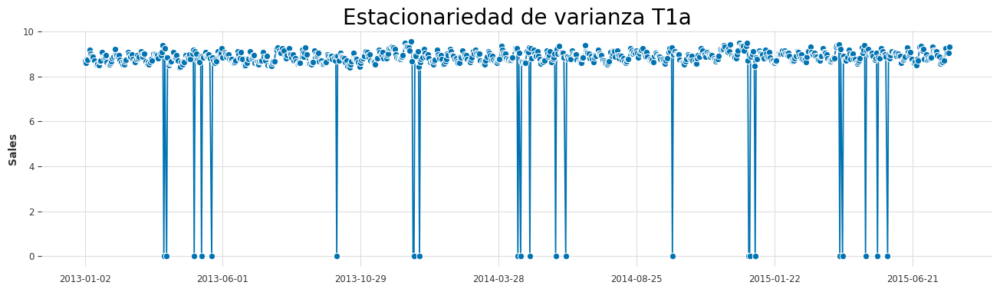

In [70]:
data_log_t1a=pd.DataFrame(LogTransformer().fit_transform(data_t1a['Sales']))
data_log_t1a.rename(columns = {0:'Sales'}, inplace = True)
plot_series(data_log_t1a['Sales'].to_period('d'))
difference_log = data_log_t1a.diff(axis=0).dropna()
plt.title("Estacionariedad de varianza T1a",fontsize=20);

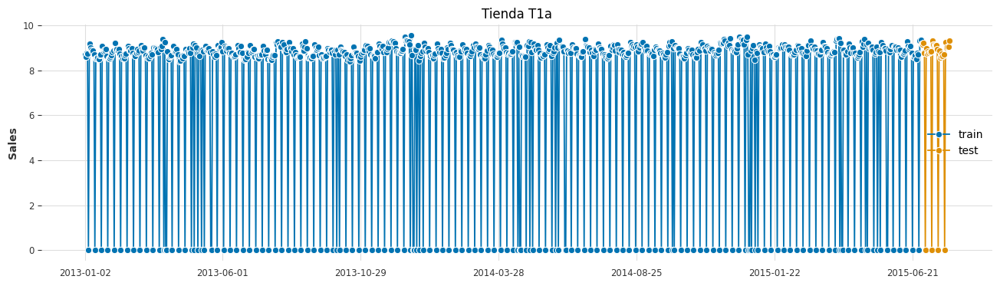

In [71]:
data_log_t1a.replace(-np.inf,0,inplace=True)

data_t1a_log_train = data_log_t1a.loc[:'2015-06-30']['Sales'].to_period('d')
data_t1a_log_test = data_log_t1a.loc['2015-07-01':]['Sales'].to_period('d')

plot_series(data_t1a_log_train, data_t1a_log_test, labels=["train", "test"])
plt.title('Tienda T1a');

In [72]:
fh_arima = np.arange(1, 32)
ARIMA_log_t1a = AutoARIMA(sp=14,suppress_warnings=True)
ARIMA_log_t1a.fit(data_t1a_log_train)
log_y_pred_arima_t1a = ARIMA_log_t1a.predict(fh_arima)

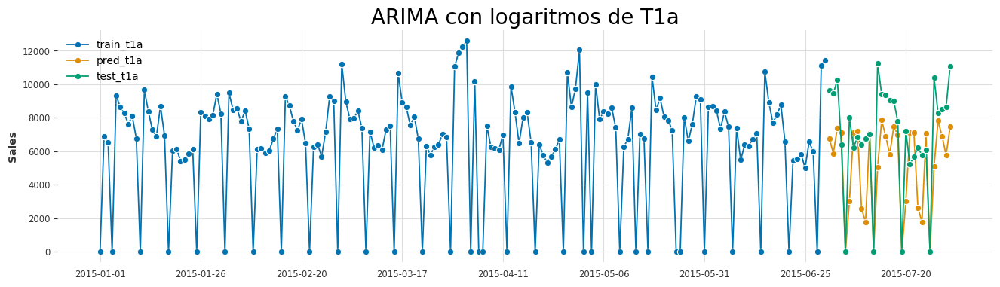

In [73]:
plot_series(data_t1a_train["2015-01-01":], np.exp(log_y_pred_arima_t1a),data_t1a_test, labels=["train_t1a", "pred_t1a", "test_t1a"])
plt.title("ARIMA con logaritmos de T1a",fontsize=20);

In [74]:
ARIMA_pred_df = pd.DataFrame(np.exp(log_y_pred_arima_t1a)) 
ARIMA_pred_df[0] = np.where((ARIMA_pred_df[0] < 2000), 0, ARIMA_pred_df[0])

In [75]:
MAPE_ARIMA_t1a=mean_absolute_percentage_error(data_t1a_test, ARIMA_pred_df[0])
MSE_ARIMA_t1a=mse(data_t1a_test, ARIMA_pred_df[0])
RMSE_ARIMA_t1a=rmse(data_t1a_test, ARIMA_pred_df[0])

In [76]:
MAPE_ARIMA_t1a

0.3045647759657052

#### ARIMA sin transformación T1a

In [77]:
ARIMA_t1a = AutoARIMA(sp=14,suppress_warnings=True)
ARIMA_t1a.fit(data_t1a_train)
y_pred_arima_t1a = ARIMA_t1a.predict(fh_arima)

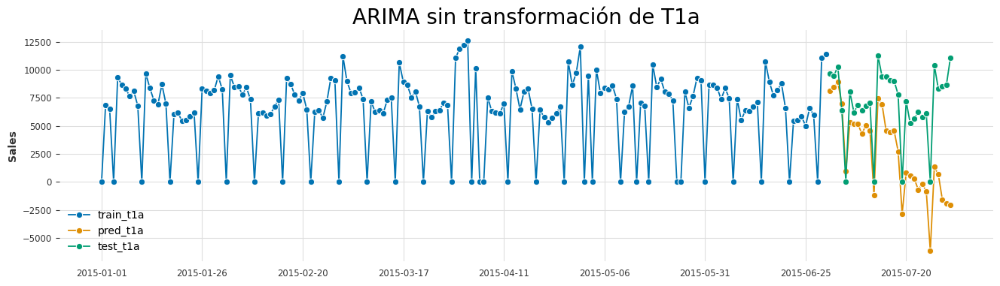

In [78]:
plot_series(data_t1a_train["2015-01-01":], y_pred_arima_t1a,data_t1a_test, labels=["train_t1a", "pred_t1a", "test_t1a"])
plt.title("ARIMA sin transformación de T1a",fontsize=20);

#### 4Theta T1a

In [79]:
data_4theta_t1a = data_t1a.copy()
data_4theta_t1a = data_4theta_t1a.replace(0,1)

data_4theta_t1a_train = data_4theta_t1a.loc[:'2015-05-31']
data_4theta_t1a_val = data_4theta_t1a.loc['2015-06-01':'2015-06-30']
data_4theta_t1a_test = data_4theta_t1a.loc['2015-07-01':]
data_4theta_t1a_train_completo = data_4theta_t1a.loc[:'2015-06-30']

In [80]:
train_4theta_t1a = TimeSeries.from_dataframe(data_4theta_t1a_train)
val_4theta_t1a = TimeSeries.from_dataframe(data_4theta_t1a_val)
test_4theta_t1a = TimeSeries.from_dataframe(data_4theta_t1a_test)
train_completo_4theta_t1a = TimeSeries.from_dataframe(data_4theta_t1a_train_completo)

In [ ]:
warnings.filterwarnings("ignore")

theta_grid_t1a = {
    'theta':2- np.linspace(-10, 10, 10),
    'model_mode': [ModelMode.ADDITIVE,ModelMode.MULTIPLICATIVE],
    'season_mode': [SeasonalityMode.MULTIPLICATIVE,SeasonalityMode.ADDITIVE],
    'trend_mode': [TrendMode.EXPONENTIAL,TrendMode.LINEAR]
}

best_grid_theta_model_t1a=FourTheta.gridsearch(parameters=theta_grid_t1a,
                                series=train_4theta_t1a,
                                forecast_horizon=30,
                                start=0.5,
                                last_points_only=False,
                                metric=mape,
                                reduction=np.mean,
                                verbose=False,
                                n_jobs=-1)

best_grid_theta_model_t1a

In [82]:
theta_t1a=FourTheta(theta=best_grid_theta_model_t1a[1]['theta'],
                 model_mode=ModelMode.ADDITIVE,
                 season_mode=SeasonalityMode.MULTIPLICATIVE,
                 trend_mode=TrendMode.EXPONENTIAL,
                 seasonality_period = 14
                 )
theta_t1a.fit(train_4theta_t1a)
pred_modelo_val_theta_t1a = theta_t1a.predict(len(val_4theta_t1a))

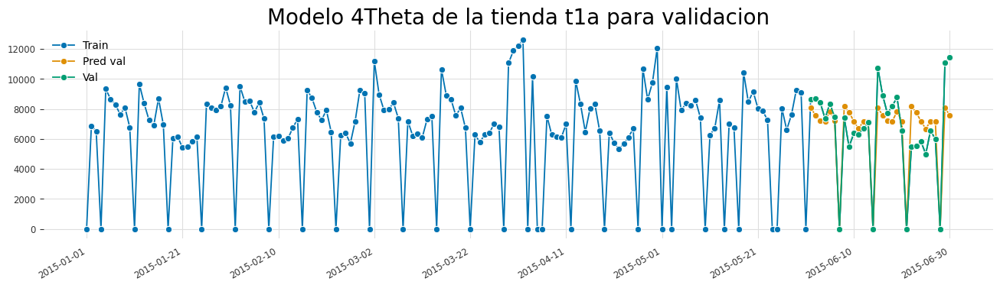

In [83]:
fig, ax = plot_series(train_completo_4theta_t1a.pd_series()["2015-01-01":].to_period('d'),
                      pred_modelo_val_theta_t1a.pd_series().to_period('d'),
                      val_4theta_t1a.pd_series().to_period('d'),
                      labels=["Train", "Pred val", "Val"])
fig.autofmt_xdate()
ax.legend(loc='upper left')
plt.title("Modelo 4Theta de la tienda t1a para validacion",fontsize=20);

In [84]:
theta_t1a.fit(train_completo_4theta_t1a)
pred_modelo_test_theta_t1a = theta_t1a.predict(len(test_4theta_t1a))

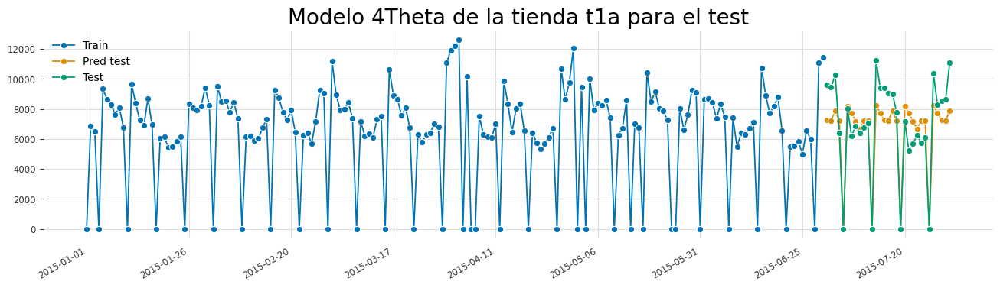

In [85]:
fig, ax = plot_series(train_completo_4theta_t1a.pd_series()["2015-01-01":].to_period('d'),
                      pred_modelo_test_theta_t1a.pd_series().to_period('d'),
                      test_4theta_t1a.pd_series().to_period('d'),
                      labels=["Train", "Pred test", "Test"])
fig.autofmt_xdate()
ax.legend(loc='upper left')
plt.title("Modelo 4Theta de la tienda t1a para el test",fontsize=20);

In [86]:
THETA_pred_df = pred_modelo_test_theta_t1a.pd_dataframe()
THETA_pred_df["Sales"] = np.where((THETA_pred_df["Sales"] < 2000), 0, THETA_pred_df["Sales"])

In [87]:
MAPE_THETA_t1a=mean_absolute_percentage_error(data_t1a_test, THETA_pred_df["Sales"])
MSE_THETA_t1a=mse(data_t1a_test, THETA_pred_df["Sales"])
RMSE_THETA_t1a=rmse(data_t1a_test, THETA_pred_df["Sales"])

#### TBATS T1a

In [88]:
modelo_tbats =TBATS(
use_box_cox=None,
box_cox_bounds=(0, 1),
use_trend=None,
use_damped_trend=None,
seasonal_periods=(14,1),
use_arma_errors=True,
show_warnings=False,
multiprocessing_start_method='spawn',
random_state=0)

modelo_tbats.fit(train_completo_4theta_t1a);

In [89]:
forecast_tbats_t1a = modelo_tbats.predict(len(test_4theta_t1a))

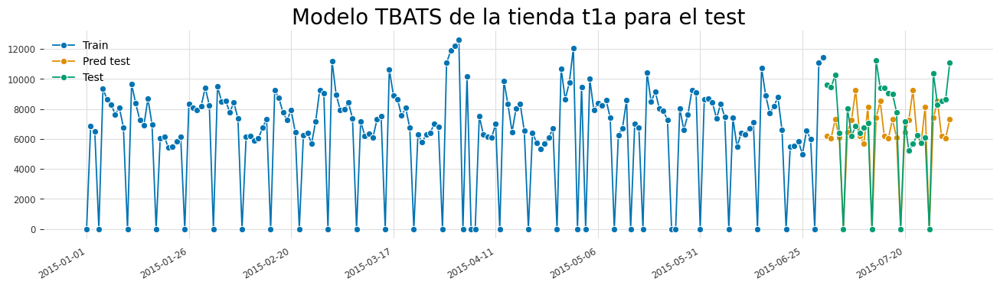

In [90]:
fig, ax = plot_series(train_completo_4theta_t1a.pd_series()["2015-01-01":].to_period('d'),
                      forecast_tbats_t1a.pd_series().to_period('d'),
                      test_4theta_t1a.pd_series().to_period('d'),
                      labels=["Train", "Pred test", "Test"])
fig.autofmt_xdate()
ax.legend(loc='upper left')
plt.title("Modelo TBATS de la tienda t1a para el test",fontsize=20);

In [92]:
TBATS_pred_df = forecast_tbats_t1a.pd_dataframe()
TBATS_pred_df["Sales"] = np.where((TBATS_pred_df["Sales"] < 2000), 0, TBATS_pred_df["Sales"])

In [93]:
MAPE_TBATS_t1a=mean_absolute_percentage_error(data_t1a_test, TBATS_pred_df["Sales"])
MSE_TBATS_t1a=mse(data_t1a_test, TBATS_pred_df["Sales"])
RMSE_TBATS_t1a=rmse(data_t1a_test, TBATS_pred_df["Sales"])

##  VAR  entre clientes y ventas T1a

In [94]:
from statsmodels.tsa.api import VAR

data_t1a_VAR = faltantes[faltantes['Store'] == 'T1a']
data_t1a_VAR = data_t1a_VAR[(['Date','Sales','Customers'])]
#data_t1a.isna().sum()
data_t1a_VAR = data_t1a_VAR.fillna(1)
data_t1a_VAR = data_t1a_VAR.set_index('Date')

data_t1a_var_train = data_t1a_VAR.loc[:'2015-06-30'].to_period('d')
data_t1a_var_test = data_t1a_VAR.loc['2015-07-01':].to_period('d')

In [95]:
var_t1a = VAR(data_t1a_var_train)
var_t1a.select_order(30)
results_var_t1a = var_t1a.fit(maxlags=30, ic='aic')

In [96]:
lag_order_t1a=results_var_t1a.k_ar
f_data_t1a=results_var_t1a.forecast(data_t1a_var_train.values[-lag_order_t1a:],31)
data_fore_t1a=pd.DataFrame(f_data_t1a)
data_fore_t1a.index=data_t1a_var_test.index
data_fore_t1a.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)

In [97]:
data_fore_t1a['Sales'] = np.where((data_fore_t1a.Sales < 2000), 0, data_fore_t1a.Sales)

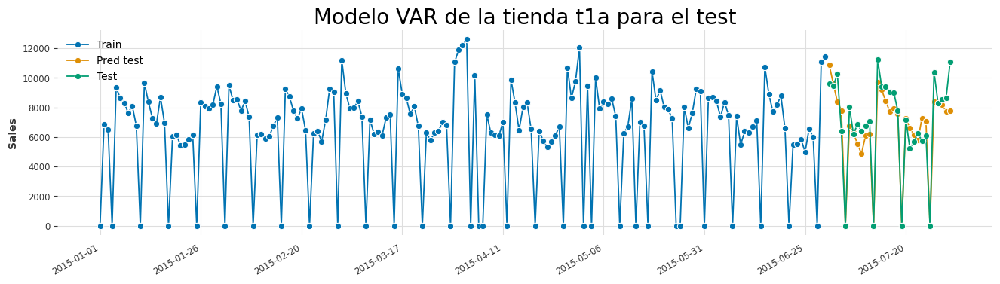

In [98]:
fig, ax = plot_series(data_t1a_var_train['Sales']['2015-01-01':],
                      data_fore_t1a['Sales'],
                      data_t1a_var_test['Sales'],
                      labels=["Train", "Pred test", "Test"])
fig.autofmt_xdate()
ax.legend(loc='upper left')
plt.title("Modelo VAR de la tienda t1a para el test",fontsize=20);

In [99]:
MAPE_VAR_t1a=mean_absolute_percentage_error(data_t1a_var_test['Sales'], data_fore_t1a['Sales'])
MSE_VAR_t1a=mse(data_t1a_var_test['Sales'], data_fore_t1a['Sales'])
RMSE_VAR_t1a=rmse(data_t1a_var_test['Sales'], data_fore_t1a['Sales'])

## Prophet T1a

In [100]:
data_t1a_prophet = datos.copy()
data_t1a_prophet = data_t1a_prophet[data_t1a_prophet['Store']=='T1a']
data_t1a_prophet = data_t1a_prophet.reset_index()

data_t1a_prophet_def = data_t1a_prophet[['Date','Sales']].rename(columns = {'Date': 'ds','Sales': 'y'})

In [101]:
state_holidays_t1a = data_t1a_prophet[data_t1a_prophet['StateHoliday'].isin(['a','b','c'])].loc[:, 'Date'].values
school_holidays_t1a = data_t1a_prophet[data_t1a_prophet.SchoolHoliday == 1].loc[:, 'Date'].values

state_holidays_t1a_df = pd.DataFrame({'ds': pd.to_datetime(state_holidays_t1a),
                                      'holiday': 'state_holiday'})
school_holidays_t1a_df = pd.DataFrame({'ds': pd.to_datetime(school_holidays_t1a),
                                       'holiday': 'school_holiday'})

holidays_t1a = pd.concat((state_holidays_t1a_df, school_holidays_t1a_df)) 

In [102]:
warnings.filterwarnings("ignore")

data_t1a_prophet_def_train = data_t1a_prophet_def[data_t1a_prophet_def['ds']<='2015-06-30']
data_t1a_prophet_def_test = data_t1a_prophet_def[data_t1a_prophet_def['ds']>'2015-06-30']

from prophet import Prophet
prophet_t1a = Prophet(holidays = holidays_t1a)
prophet_t1a.fit(data_t1a_prophet_def_train)

future_dates_prophet_t1a = prophet_t1a.make_future_dataframe(periods = 31)

forecast_prophet_t1a = prophet_t1a.predict(future_dates_prophet_t1a)

16:46:51 - cmdstanpy - INFO - Chain [1] start processing
16:46:52 - cmdstanpy - INFO - Chain [1] done processing


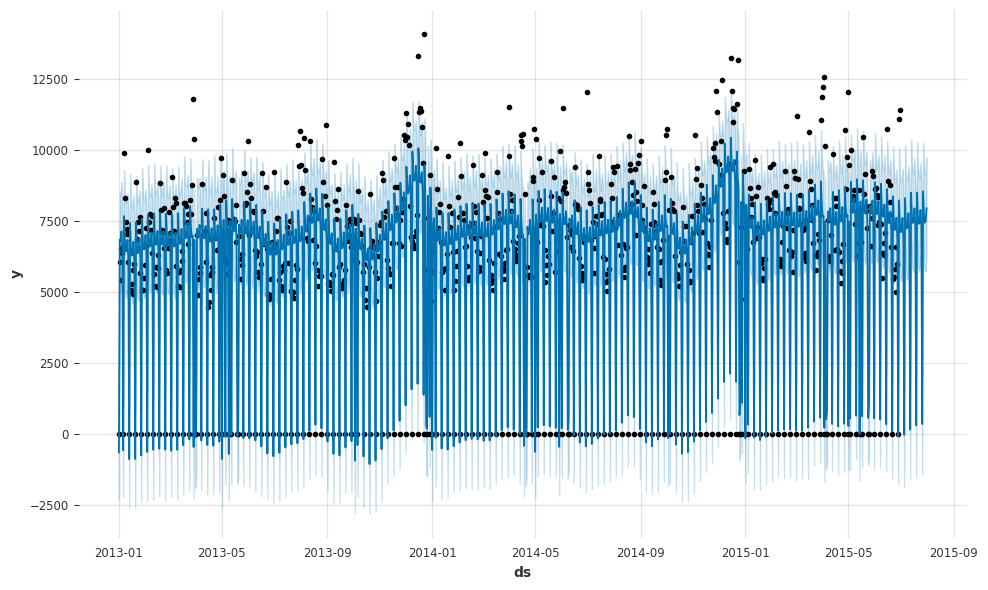

In [103]:
prophet_t1a.plot(forecast_prophet_t1a);

In [104]:
prophet_pred_t1a = forecast_prophet_t1a[['ds', 'yhat']].rename(columns = {'Date': 'ds', 'Forecast': 'yhat'})
prophet_pred_t1a = prophet_pred_t1a[prophet_pred_t1a['ds']>'2015-06-30']
prophet_pred_t1a['yhat'] = np.where((prophet_pred_t1a['yhat'] < 2000), 0, prophet_pred_t1a['yhat'])

In [105]:
MAPE_PROPHET_t1a=mean_absolute_percentage_error(data_t1a_prophet_def_test["y"], prophet_pred_t1a['yhat'][::-1])
MSE_PROPHET_t1a=mse(data_t1a_prophet_def_test["y"], prophet_pred_t1a['yhat'][::-1].reset_index()["yhat"])
RMSE_PROPHET_t1a=rmse(data_t1a_prophet_def_test["y"], prophet_pred_t1a['yhat'][::-1].reset_index()["yhat"])

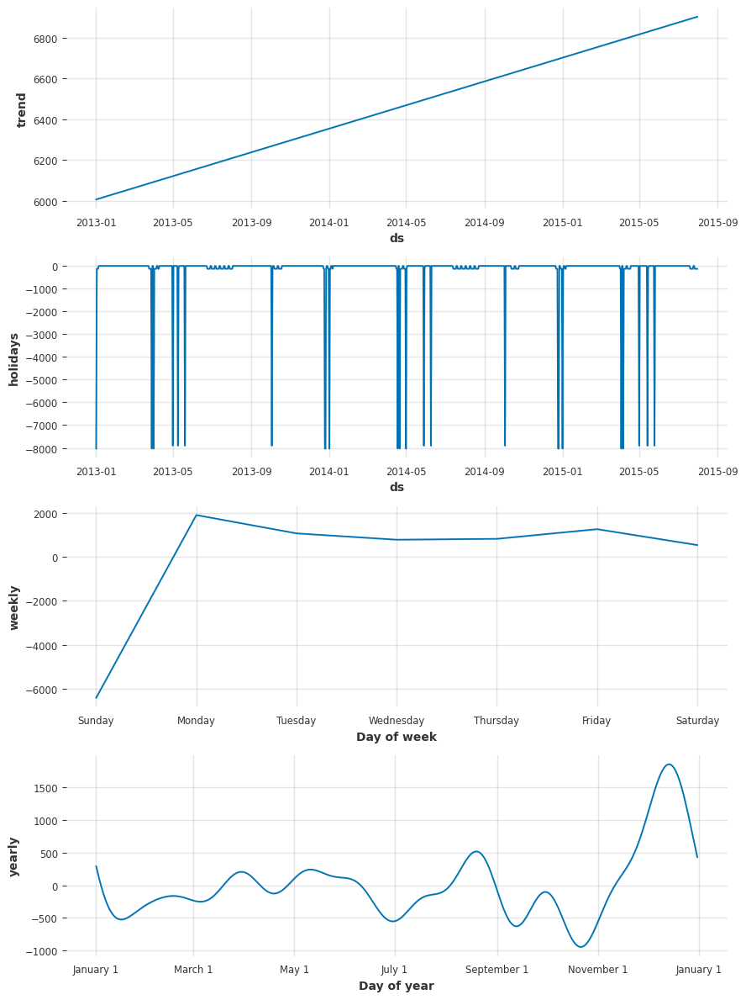

In [106]:
prophet_t1a.plot_components(forecast_prophet_t1a);

In [107]:
lista_ETS = [MAPE_ETS_t1a, MSE_ETS_t1a, RMSE_ETS_t1a]
lista_ARIMA = [MAPE_ARIMA_t1a, MSE_ARIMA_t1a, RMSE_ARIMA_t1a]
lista_TBATS = [MAPE_TBATS_t1a, MSE_TBATS_t1a, RMSE_TBATS_t1a]
lista_4THETA = [MAPE_THETA_t1a, MSE_THETA_t1a, RMSE_THETA_t1a]
lista_VAR = [MAPE_VAR_t1a, MSE_VAR_t1a, RMSE_VAR_t1a]
lista_PROPHET = [MAPE_PROPHET_t1a, MSE_PROPHET_t1a, RMSE_PROPHET_t1a]

tabla_errores=pd.DataFrame()
tabla_errores['Métrica'] = ['MAPE','MSE','RMSE']
tabla_errores=tabla_errores.set_index(tabla_errores['Métrica'])
tabla_errores=tabla_errores.drop(['Métrica'], axis=1)
tabla_errores['ETS'] = lista_ETS
tabla_errores['ARIMA log'] = lista_ARIMA
tabla_errores['4Theta']=lista_4THETA
tabla_errores['Tbats']=lista_TBATS
tabla_errores['VAR']=lista_VAR
tabla_errores['PROPHET']=lista_PROPHET
tabla_errores.round(2)

,ETS,ARIMA log,4Theta,Tbats,VAR,PROPHET
Métrica,,,,,,
MAPE,0.11,0.30,0.15,0.21,0.11,0.16
MSE,1395945.64,9649182.83,2349129.71,4588036.68,1348175.68,2417883.07
RMSE,1181.50,3106.31,1532.69,2141.97,1161.11,1554.95


# Predicciones ETS por tienda

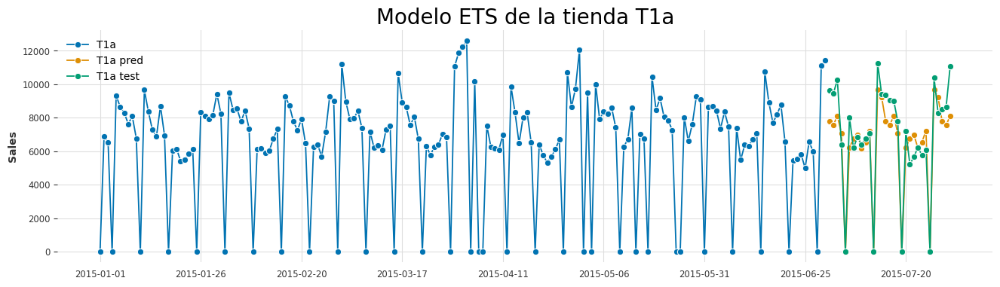

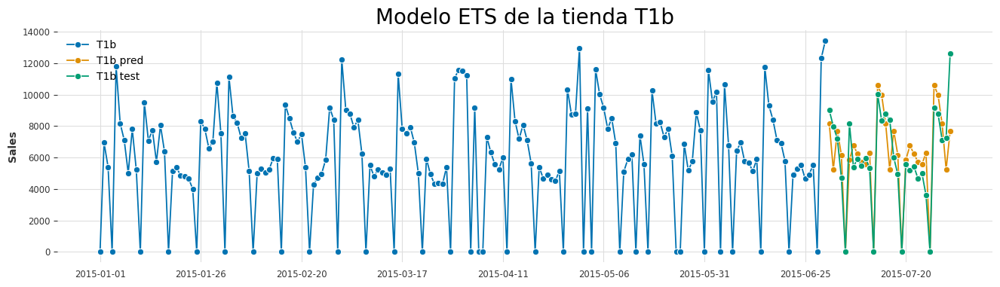

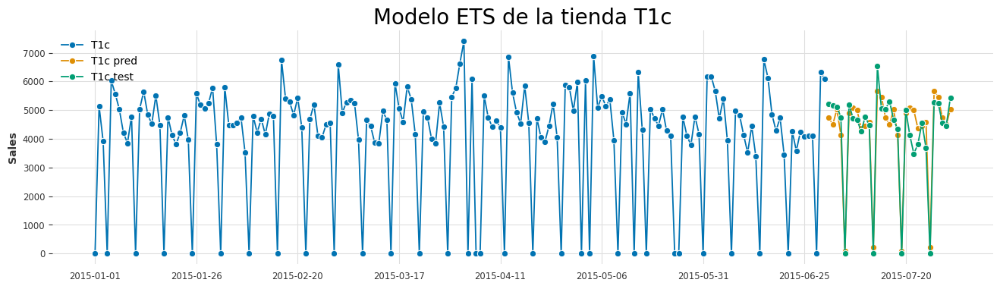

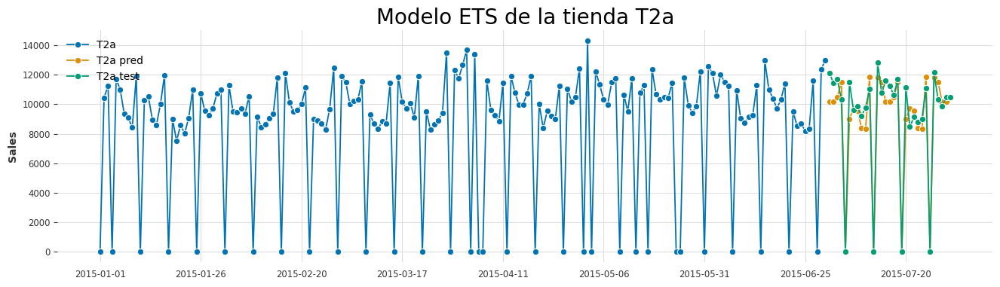

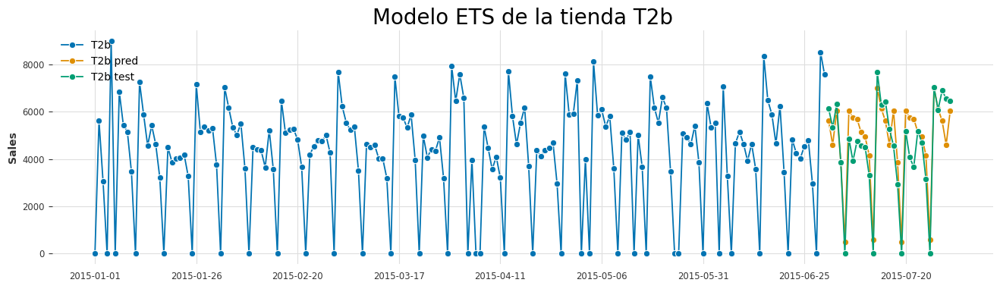

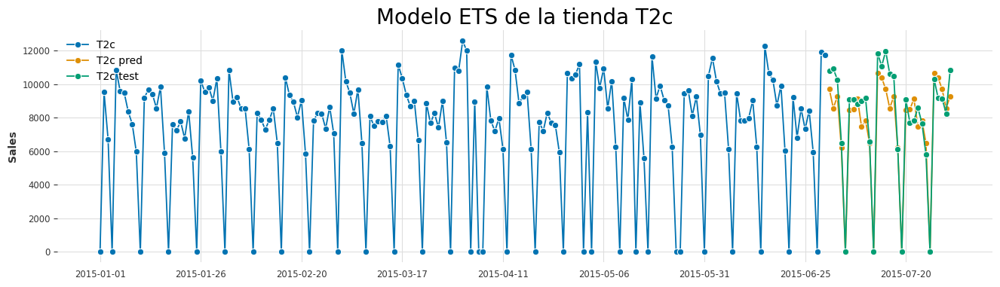

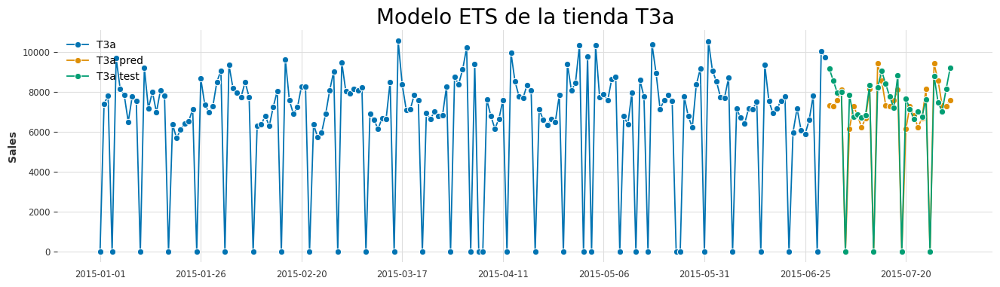

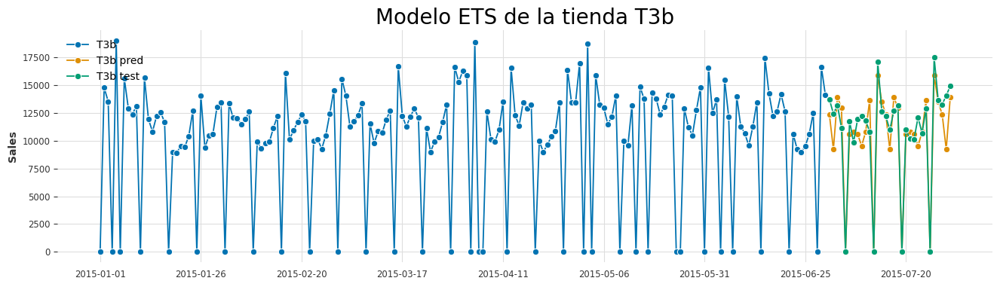

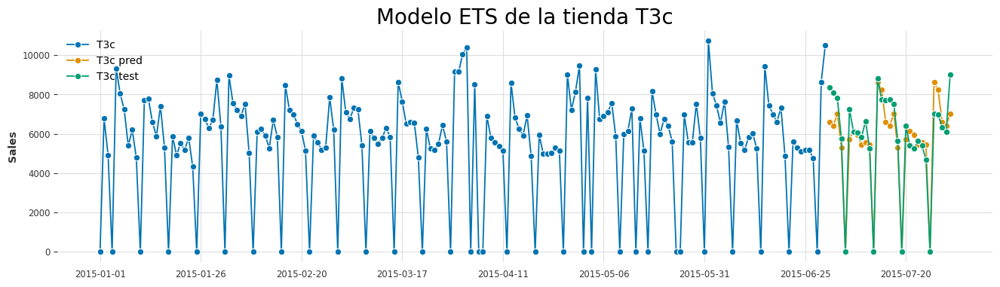

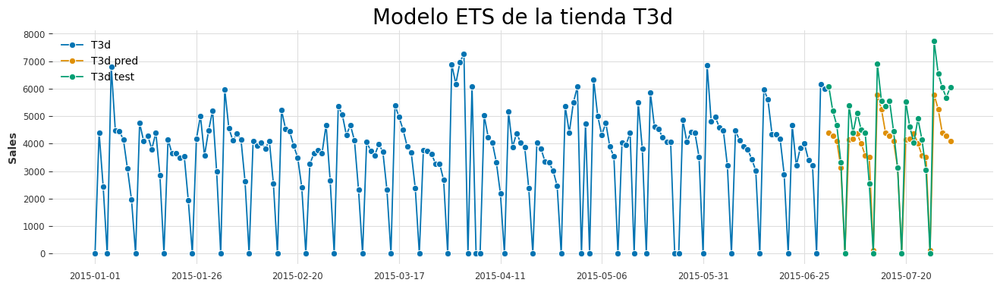

In [108]:
preds_tiendas_ETS = pd.DataFrame()
tests_tiendas_ETS = pd.DataFrame() 

for store in sorted(faltantes["Store"].unique()):
    data_txx = faltantes[faltantes['Store'] == store]
    data_txx = data_txx[(['Date','Sales'])]
    data_txx = data_txx.fillna(1)
    data_txx = data_txx.set_index('Date')

    data_txx_train = data_txx.loc[:'2015-06-30']['Sales'].to_period('d')
    data_txx_test = data_txx.loc['2015-07-01':]['Sales'].to_period('d')
    tests_tiendas_ETS[store] = data_txx_test


    fh_ets = np.arange(1, 32)
    ETS = AutoETS(auto=True, sp=14, n_jobs=-1)
    ETS.fit(data_txx_train)

    ETS_pred = ETS.predict(fh_ets)
    preds_tiendas_ETS[store] = np.where((ETS_pred < 2000), 0, ETS_pred)
    
    fig, ax = plot_series(data_txx_train['2015-01-01':], ETS_pred, data_txx_test, labels=[store, str(store + " pred"), str(store + " test")])
    plt.title(str("Modelo ETS de la tienda " +store), fontsize=20)
    ax.legend(loc='upper left')

In [109]:
tests_tiendas_ETS_total = tests_tiendas_ETS.sum(axis=1)
preds_tiendas_ETS_total = preds_tiendas_ETS.sum(axis=1)

In [110]:
MAPE_ETS_txx =mean_absolute_percentage_error(tests_tiendas_ETS_total, preds_tiendas_ETS_total)
MSE_ETS_txx =mse(tests_tiendas_ETS_total, preds_tiendas_ETS_total)
RMSE_ETS_txx =rmse(tests_tiendas_ETS_total, preds_tiendas_ETS_total)

In [111]:
MAPE_ETS_txx

0.07777355164446924

# Predicciones ETS por zona

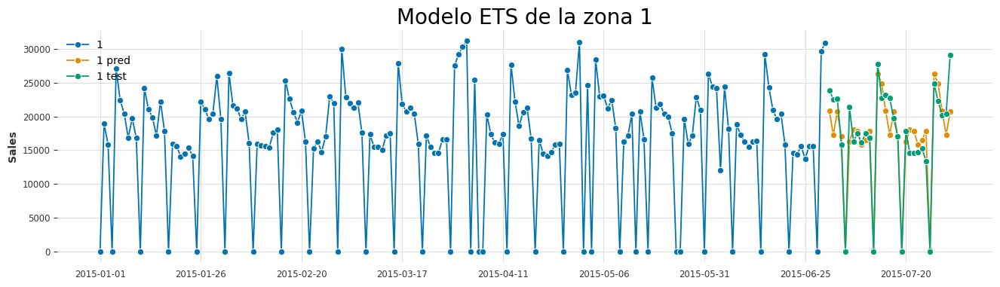

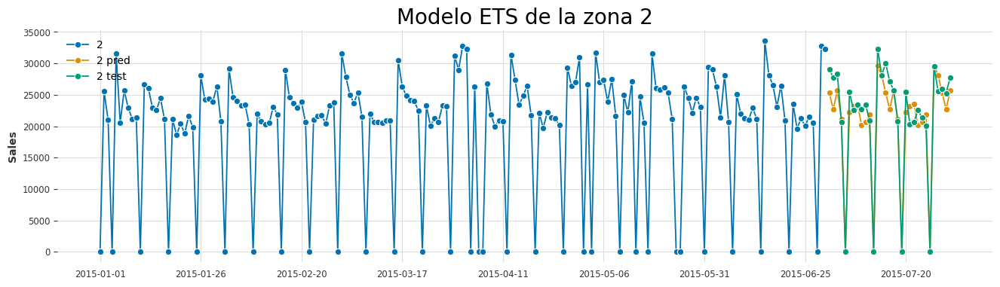

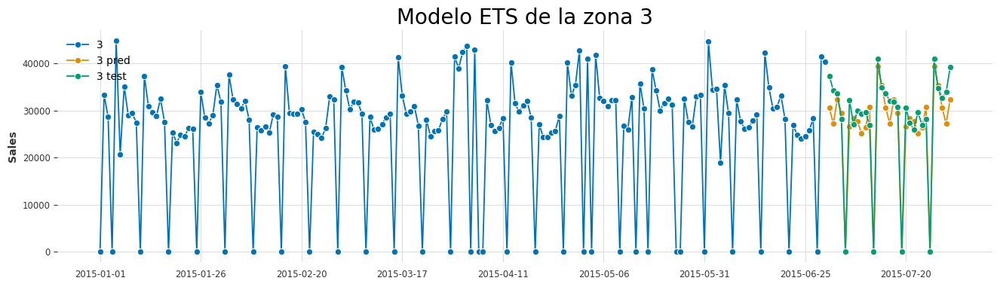

In [112]:
preds_zonas_ETS = pd.DataFrame()
tests_zonas_ETS = pd.DataFrame() 

for zona in sorted(faltantes_zona["Zona"].unique()):
    data_zona = faltantes_zona[faltantes_zona["Zona"] == zona]
    data_zona = data_zona.groupby("Date").agg({"Sales":"sum"})
    data_zona = data_zona.fillna(1)

    data_zona_train = data_zona.loc[:'2015-06-30']['Sales'].to_period('d')
    data_zona_test = data_zona.loc['2015-07-01':]['Sales'].to_period('d')
    tests_zonas_ETS[zona] = data_zona_test


    fh_ets = np.arange(1, 32)
    ETS = AutoETS(auto=True, sp=14, n_jobs=-1)
    ETS.fit(data_zona_train)

    ETS_pred = ETS.predict(fh_ets)
    preds_zonas_ETS[zona] = np.where((ETS_pred < 5000), 0, ETS_pred)
    
    fig, ax = plot_series(data_zona_train['2015-01-01':], ETS_pred, data_zona_test, labels=[zona, str(zona + " pred"), str(zona + " test")])
    plt.title(str("Modelo ETS de la zona " +zona), fontsize=20)
    ax.legend(loc='upper left')

In [113]:
tests_zonas_ETS_total = tests_zonas_ETS.sum(axis=1)
preds_zonas_ETS_total = preds_zonas_ETS.sum(axis=1)

In [114]:
MAPE_ETS_zona =mean_absolute_percentage_error(tests_zonas_ETS_total, preds_zonas_ETS_total)
MSE_ETS_zona =mse(tests_zonas_ETS_total, preds_zonas_ETS_total)
RMSE_ETS_zona =rmse(tests_zonas_ETS_total, preds_zonas_ETS_total)

In [115]:
MAPE_ETS_zona

0.07955082507865464

# Predicciones ETS total

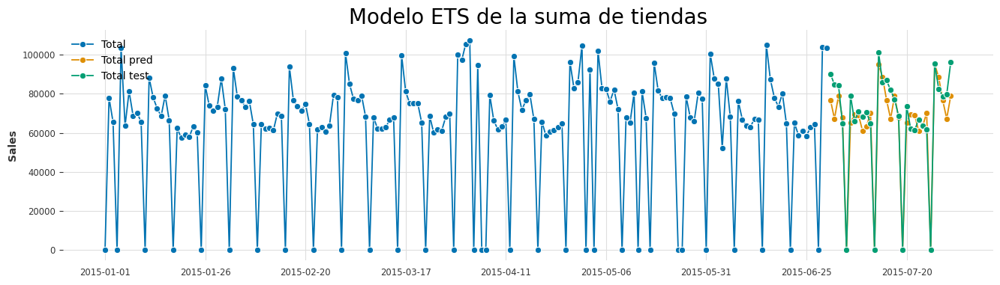

In [116]:
preds_total_ETS = pd.DataFrame()
tests_total_ETS = pd.DataFrame() 

data_total = faltantes.groupby("Date").agg({"Sales":"sum"})
data_total = data_total.fillna(1)

data_total_train = data_total.loc[:'2015-06-30']['Sales'].to_period('d')
data_total_test = data_total.loc['2015-07-01':]['Sales'].to_period('d')
tests_total_ETS[zona] = data_total_test


fh_ets = np.arange(1, 32)
ETS = AutoETS(auto=True, sp=14, n_jobs=-1)
ETS.fit(data_total_train)

ETS_pred = ETS.predict(fh_ets)
preds_total_ETS[zona] = np.where((ETS_pred < 20000), 0, ETS_pred)

fig, ax = plot_series(data_total_train['2015-01-01':], ETS_pred, data_total_test, labels=["Total", str("Total pred"), str("Total test")])
plt.title(str("Modelo ETS de la suma de tiendas"), fontsize=20)
ax.legend(loc='upper left');

In [117]:
tests_total_ETS_total = tests_total_ETS.sum(axis=1)
preds_total_ETS_total = preds_total_ETS.sum(axis=1)

In [118]:
MAPE_ETS_total =mean_absolute_percentage_error(tests_total_ETS_total, preds_total_ETS_total)
MSE_ETS_total =mse(tests_total_ETS_total, preds_total_ETS_total)
RMSE_ETS_total =rmse(tests_total_ETS_total, preds_total_ETS_total)

In [119]:
MAPE_ETS_total

0.07938169307555047

# Predicciones VAR por tienda

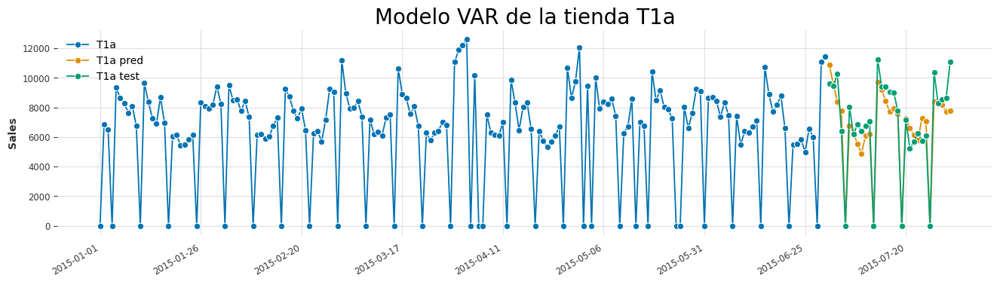

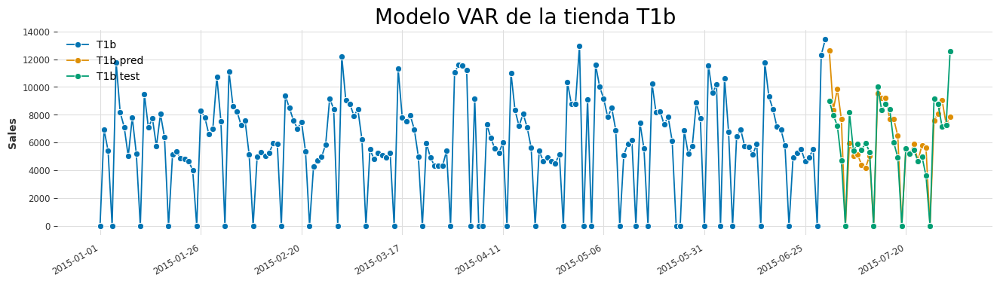

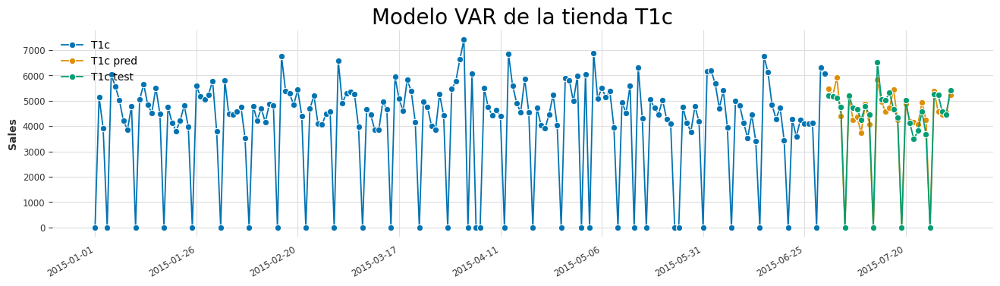

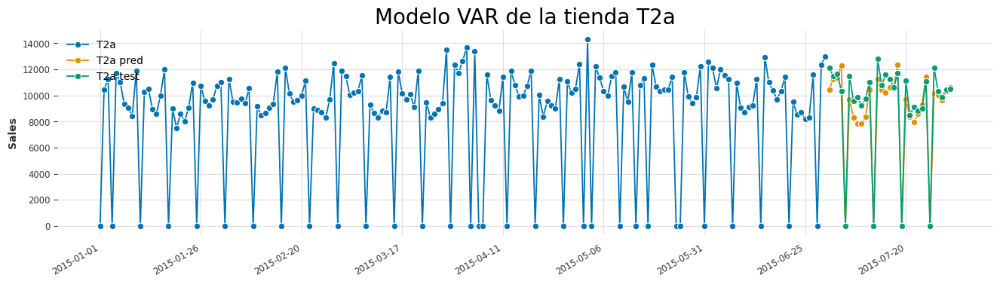

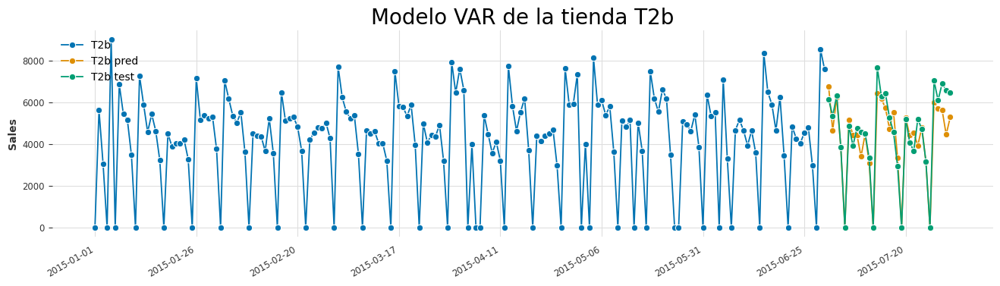

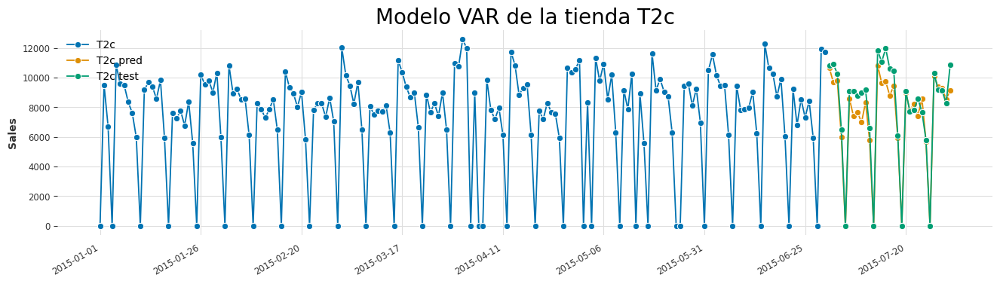

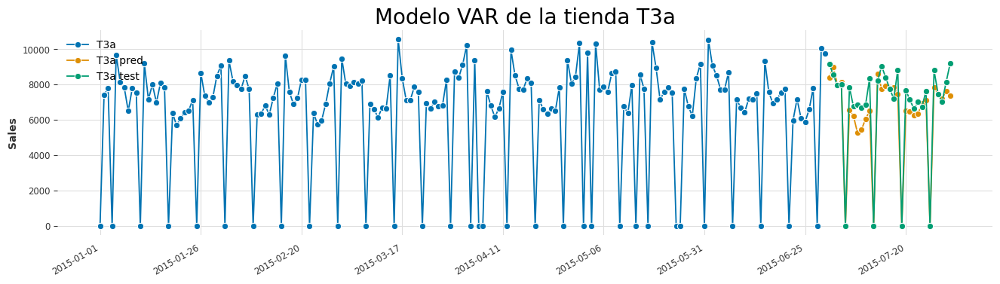

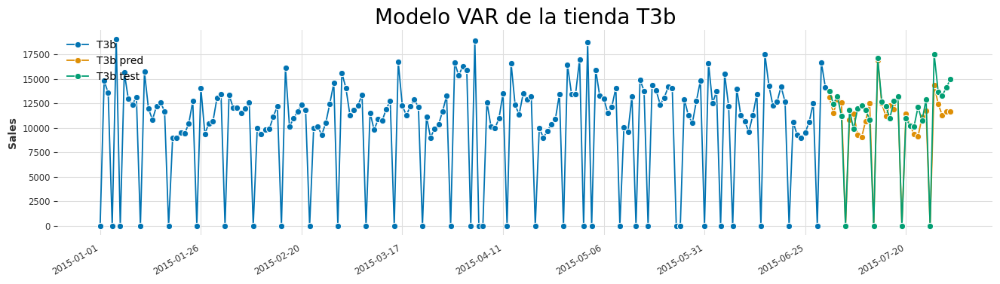

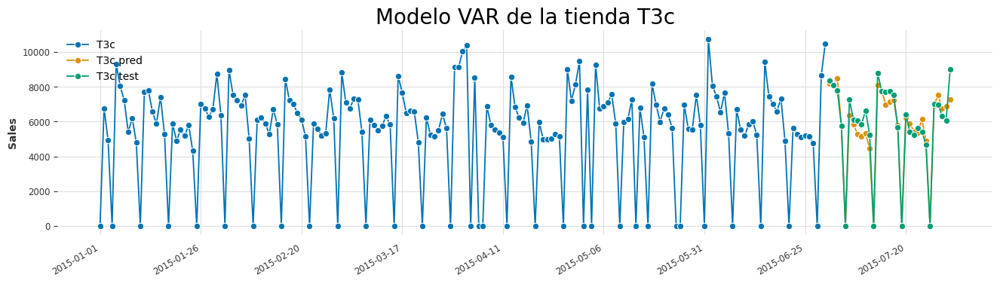

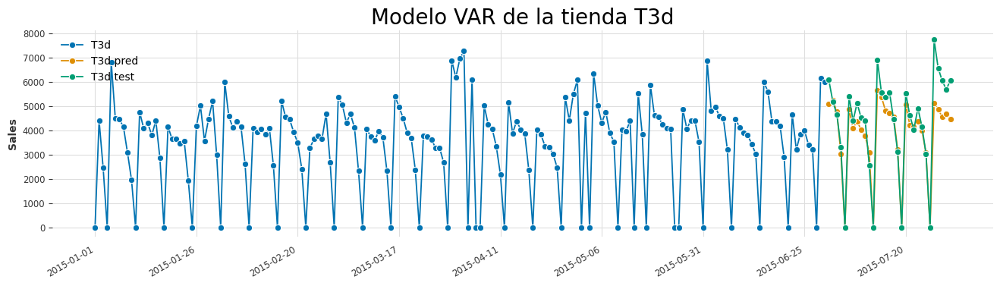

In [120]:
preds_tiendas_VAR = pd.DataFrame()
tests_tiendas_VAR = pd.DataFrame() 

for store in sorted(faltantes["Store"].unique()):
    
    data_txx_VAR = faltantes[faltantes['Store'] == store]
    data_txx_VAR = data_txx_VAR[(['Date','Sales','Customers'])]
    data_txx_VAR = data_txx_VAR.fillna(1)
    data_txx_VAR = data_txx_VAR.set_index('Date')

    data_txx_var_train = data_txx_VAR.loc[:'2015-06-30'].to_period('d')
    data_txx_var_test = data_txx_VAR.loc['2015-07-01':].to_period('d')

    var_txx = VAR(data_txx_var_train)
    var_txx.select_order(30)
    results_var_txx = var_txx.fit(maxlags=30, ic='aic')

    lag_order_txx=results_var_txx.k_ar
    f_data_txx=results_var_txx.forecast(data_txx_var_train.values[-lag_order_txx:],31)
    data_fore_txx=pd.DataFrame(f_data_txx)
    data_fore_txx.index=data_txx_var_test.index
    data_fore_txx.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)

    data_fore_txx['Sales'] = np.where((data_fore_txx.Sales < 2000), 0, data_fore_txx.Sales)
    
    preds_tiendas_VAR[store] = np.where((data_fore_txx.Sales < 2000), 0, data_fore_txx.Sales)
    tests_tiendas_VAR[store] = data_txx_var_test["Sales"]

    fig, ax = plot_series(data_txx_var_train['Sales']['2015-01-01':],
                          data_fore_txx['Sales'],
                          data_txx_var_test['Sales'],
                          labels=[store, str(store + " pred"), str(store + " test")])
    
    fig.autofmt_xdate()
    ax.legend(loc='upper left')
    plt.title("Modelo VAR de la tienda " + store,fontsize=20);
preds_tiendas_VAR['Date']=tests_tiendas_VAR.index
preds_tiendas_VAR=preds_tiendas_VAR.set_index('Date')

In [121]:
tests_tiendas_VAR_total = tests_tiendas_VAR.sum(axis=1)
preds_tiendas_VAR_total = preds_tiendas_VAR.sum(axis=1)

In [122]:
MAPE_VAR_txx =mean_absolute_percentage_error(tests_tiendas_VAR_total, preds_tiendas_VAR_total)
MSE_VAR_txx =mse(tests_tiendas_VAR_total, preds_tiendas_VAR_total)
RMSE_VAR_txx =rmse(tests_tiendas_VAR_total, preds_tiendas_VAR_total)

In [123]:
MAPE_VAR_txx

0.06325340816381589

# Predicciones VAR por zona

In [124]:
data_zona = faltantes_zona[faltantes_zona["Zona"] == "1"]

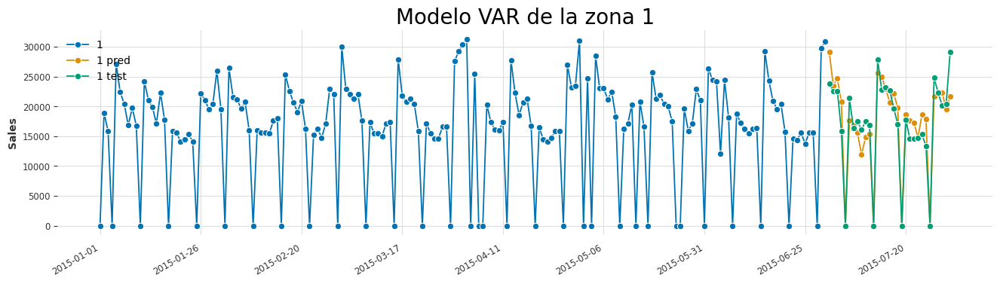

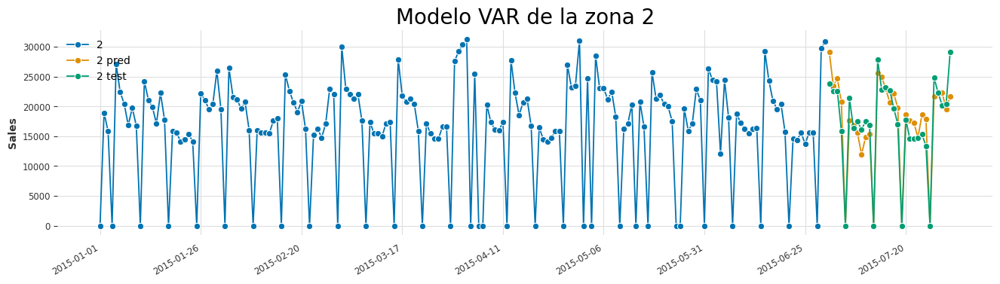

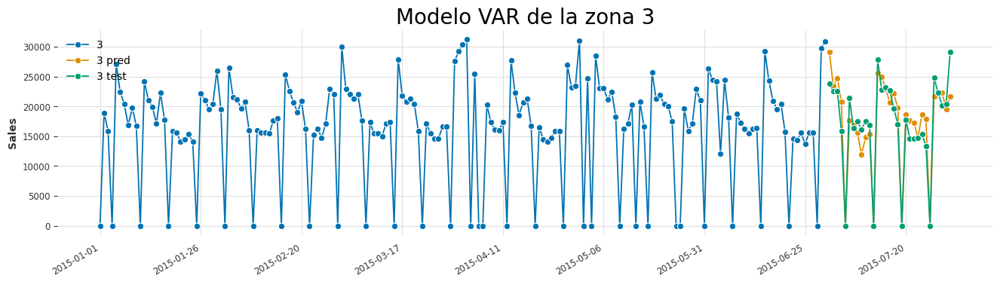

In [125]:
preds_zonas_VAR = pd.DataFrame()
tests_zonas_VAR = pd.DataFrame() 

for zona in sorted(faltantes_zona["Zona"].unique()):
    
    data_zona_VAR = faltantes_zona[faltantes_zona["Zona"] == zona]
    data_zona_VAR = data_zona_VAR[(['Date','Sales','Customers'])]
    data_zona_VAR = data_zona.groupby("Date").agg({"Sales":"sum", "Customers":"sum"})
    data_zona_VAR = data_zona_VAR.fillna(1)

    data_zona_var_train = data_zona_VAR.loc[:'2015-06-30'].to_period('d')
    data_zona_var_test = data_zona_VAR.loc['2015-07-01':].to_period('d')

    var_zona = VAR(data_zona_var_train)
    var_zona.select_order(30)
    results_var_zona = var_zona.fit(maxlags=30, ic='aic')

    lag_order_zona=results_var_zona.k_ar
    f_data_zona=results_var_zona.forecast(data_zona_var_train.values[-lag_order_zona:],31)
    data_fore_zona=pd.DataFrame(f_data_zona)
    data_fore_zona.index=data_zona_var_test.index
    data_fore_zona.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)

    data_fore_zona['Sales'] = np.where((data_fore_zona.Sales < 5000), 0, data_fore_zona.Sales)
    
    preds_zonas_VAR[store] = np.where((data_fore_zona.Sales < 5000), 0, data_fore_zona.Sales)
    tests_zonas_VAR[store] = data_zona_var_test["Sales"]

    fig, ax = plot_series(data_zona_var_train['Sales']['2015-01-01':],
                          data_fore_zona['Sales'],
                          data_zona_var_test['Sales'],
                          labels=[zona, str(zona + " pred"), str(zona + " test")])
    fig.autofmt_xdate()
    ax.legend(loc='upper left')
    plt.title("Modelo VAR de la zona " + zona, fontsize=20);



In [126]:
tests_zonas_VAR_total = tests_zonas_VAR.sum(axis=1)
preds_zonas_VAR_total = preds_zonas_VAR.sum(axis=1)

In [127]:
MAPE_VAR_zona =mean_absolute_percentage_error(tests_zonas_VAR_total, preds_zonas_VAR_total)
MSE_VAR_zona =mse(tests_zonas_VAR_total, preds_zonas_VAR_total)
RMSE_VAR_zona =rmse(tests_zonas_VAR_total, preds_zonas_VAR_total)

In [128]:
MAPE_VAR_zona

0.11521242379537894

# Predicciones VAR total

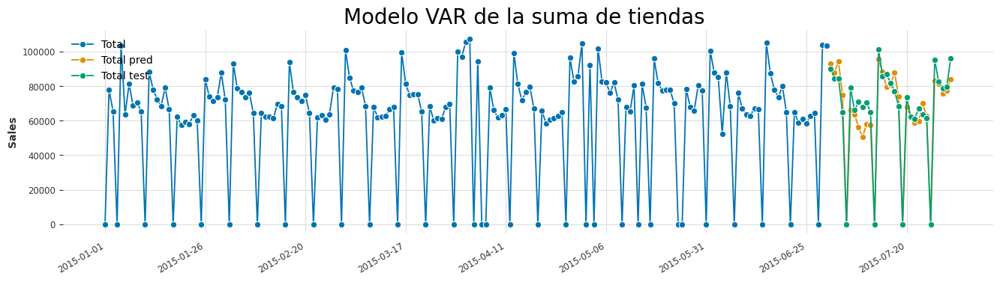

In [129]:
preds_total_VAR = pd.DataFrame()
tests_total_VAR = pd.DataFrame() 

data_total_VAR = faltantes.groupby("Date").agg({"Sales":"sum", "Customers":"sum"})
data_total_VAR = data_total_VAR.fillna(1)

data_total_var_train = data_total_VAR.loc[:'2015-06-30'].to_period('d')
data_total_var_test = data_total_VAR.loc['2015-07-01':].to_period('d')

var_total = VAR(data_total_var_train)
var_total.select_order(30)
results_var_total = var_total.fit(maxlags=30, ic='aic')

lag_order_total=results_var_total.k_ar
f_data_total=results_var_total.forecast(data_total_var_train.values[-lag_order_total:],31)
data_fore_total=pd.DataFrame(f_data_total)
data_fore_total.index=data_total_var_test.index
data_fore_total.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)

data_fore_total['Sales'] = np.where((data_fore_total.Sales < 20000), 0, data_fore_total.Sales)

preds_total_VAR[store] = np.where((data_fore_total.Sales < 20000), 0, data_fore_total.Sales)
tests_total_VAR[store] = data_total_var_test["Sales"]

fig, ax = plot_series(data_total_var_train['Sales']['2015-01-01':],
                      data_fore_total['Sales'],
                      data_total_var_test['Sales'],
                      labels=["Total", str("Total pred"), str("Total test")])
fig.autofmt_xdate()
ax.legend(loc='upper left')
plt.title("Modelo VAR de la suma de tiendas ", fontsize=20);



In [130]:
tests_total_VAR_total = tests_total_VAR.sum(axis=1)
preds_total_VAR_total = preds_total_VAR.sum(axis=1)

In [131]:
MAPE_VAR_total =mean_absolute_percentage_error(tests_total_VAR_total, preds_total_VAR_total)
MSE_VAR_total =mse(tests_total_VAR_total, preds_total_VAR_total)
RMSE_VAR_total =rmse(tests_total_VAR_total, preds_total_VAR_total)

In [132]:
MAPE_VAR_total

0.07622409462272012

In [133]:
lista_ETS_txx = [MAPE_ETS_txx, MSE_ETS_txx, RMSE_ETS_txx]
lista_ETS_zona = [MAPE_ETS_zona, MSE_ETS_zona, RMSE_ETS_zona]
lista_ETS_total = [MAPE_ETS_total, MSE_ETS_total, RMSE_ETS_total]
lista_VAR_txx = [MAPE_VAR_txx, MSE_VAR_txx, RMSE_VAR_txx]
lista_VAR_zona = [MAPE_VAR_zona, MSE_VAR_zona, RMSE_VAR_zona]
lista_VAR_total = [MAPE_VAR_total, MSE_VAR_total, RMSE_VAR_total]

tabla_errores=pd.DataFrame()
tabla_errores['Métrica'] = ['MAPE','MSE','RMSE']
tabla_errores=tabla_errores.set_index(tabla_errores['Métrica'])
tabla_errores=tabla_errores.drop(['Métrica'], axis=1)

tabla_errores['ETS Tienda'] = lista_ETS_txx
tabla_errores['ETS Zona'] = lista_ETS_zona
tabla_errores['ETS Total'] = lista_VAR_total

tabla_errores['VAR Tienda'] = lista_VAR_txx
tabla_errores['VAR Zona'] = lista_VAR_zona
tabla_errores['VAR Total'] = lista_VAR_total

tabla_errores.round(2)

,ETS Tienda,ETS Zona,ETS Total,VAR Tienda,VAR Zona,VAR Total
Métrica,,,,,,
MAPE,0.08,0.08,0.08,0.06,0.12,0.08
MSE,61708251.20,65520729.40,57859316.63,46334679.75,7996842.17,57859316.63
RMSE,7855.46,8094.49,7606.53,6806.96,2827.87,7606.53


# Predicciones diarias definitivas

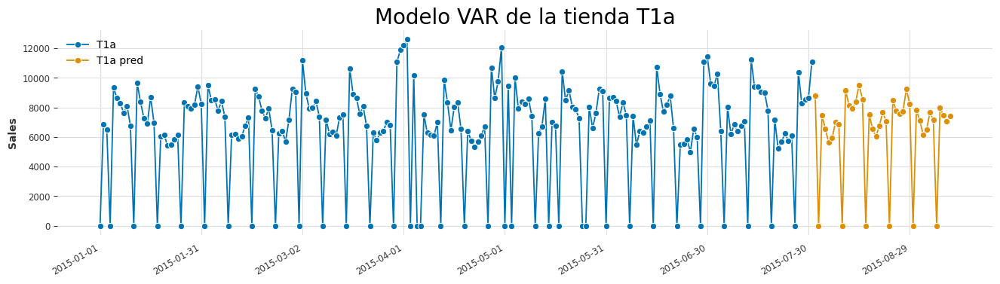

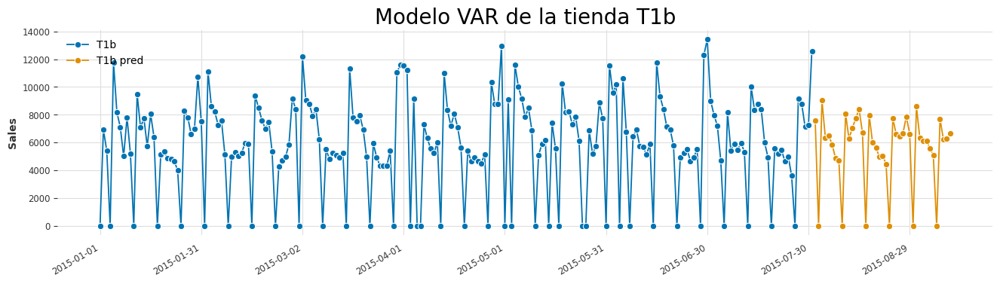

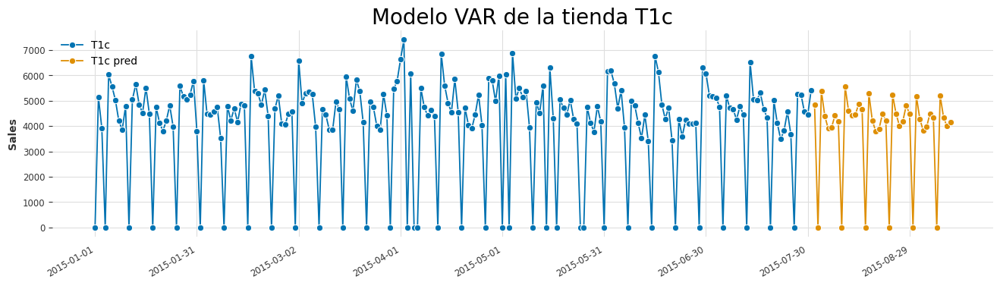

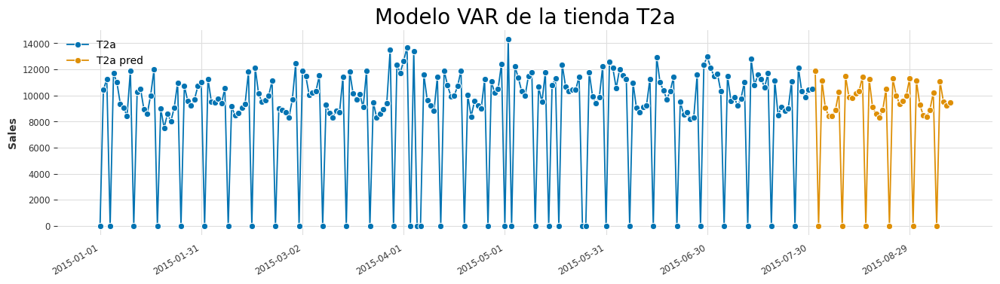

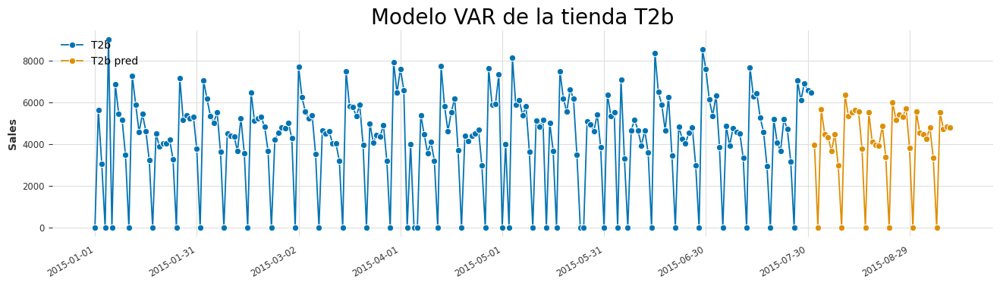

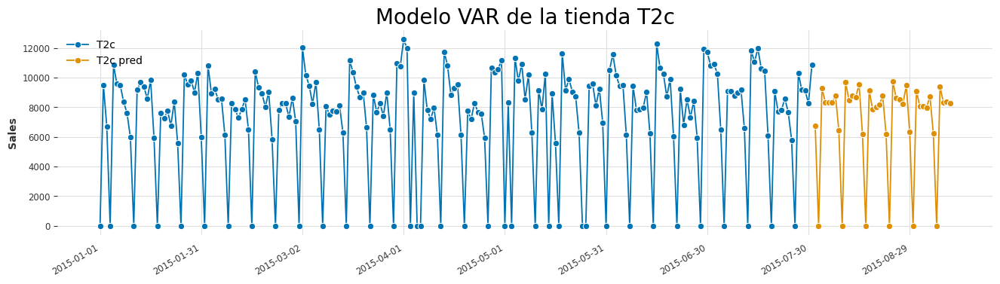

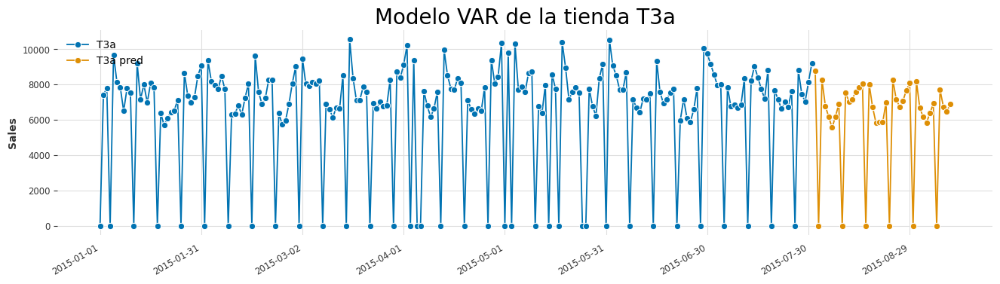

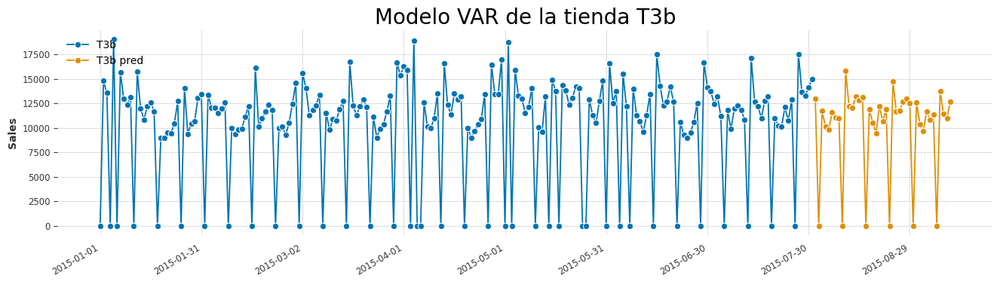

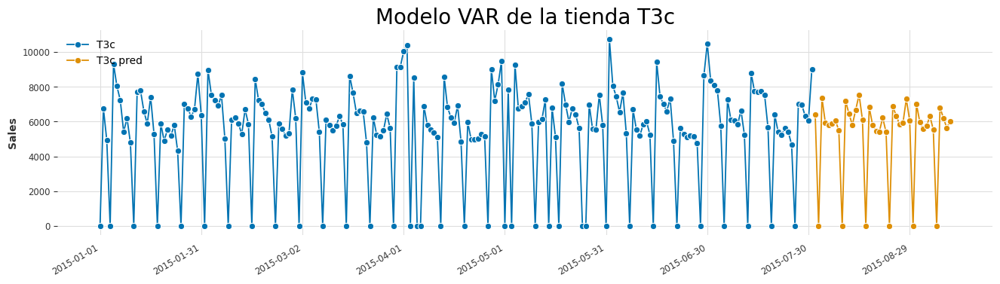

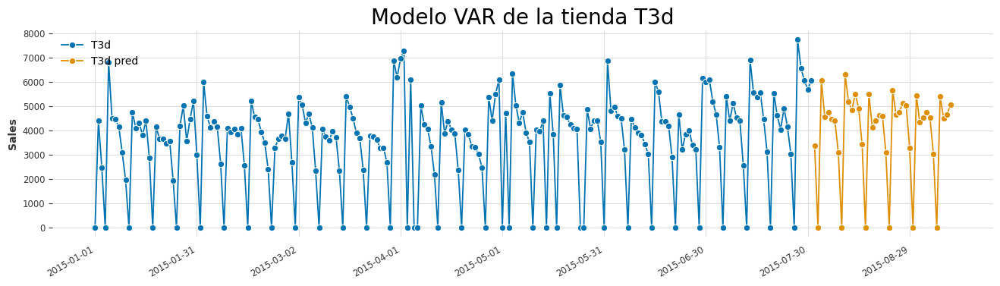

In [134]:
preds_tiendas_VAR_definitivas = pd.DataFrame()
tests_tiendas_VAR_definitivas = pd.DataFrame() 
fechas_definitivas = pd.date_range(start="2015-08-01",end="2015-09-10").to_period('d')

for store in sorted(faltantes["Store"].unique()):
    
    data_txx_VAR_definitivo = faltantes[faltantes['Store'] == store]
    data_txx_VAR_definitivo = data_txx_VAR_definitivo[(['Date','Sales','Customers'])]
    data_txx_VAR_definitivo = data_txx_VAR_definitivo.fillna(1)
    data_txx_VAR_definitivo = data_txx_VAR_definitivo.set_index('Date')

    data_txx_VAR_definitivo_train = data_txx_VAR_definitivo.to_period('d')
    
    var_txx = VAR(data_txx_VAR_definitivo_train)
    var_txx.select_order(30)
    results_var_txx = var_txx.fit(maxlags=30, ic='aic')

    lag_order_txx=results_var_txx.k_ar
    f_data_txx=results_var_txx.forecast(data_txx_VAR_definitivo_train.values[-lag_order_txx:],41)
    data_fore_txx=pd.DataFrame(f_data_txx)
    data_fore_txx.index=fechas_definitivas
    data_fore_txx.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)
    
    data_fore_txx['Sales'] = np.where((data_fore_txx.Sales < 2500), 0, data_fore_txx.Sales)
    
    if store == "T1b":
        data_fore_txx['Sales'] = np.where((data_fore_txx.Sales < 4000), 0, data_fore_txx.Sales)
    
    preds_tiendas_VAR_definitivas[store] = np.where((data_fore_txx.Sales < 2500), 0, data_fore_txx.Sales)

    fig, ax = plot_series(data_txx_VAR_definitivo_train['Sales']['2015-01-01':],
                          data_fore_txx['Sales'],
                          labels=[store, str(store + " pred")])
    fig.autofmt_xdate()
    ax.legend(loc='upper left')
    plt.title("Modelo VAR de la tienda " + store,fontsize=20);


In [135]:
preds_tiendas_VAR_definitivas['Date']=pd.date_range(start="2015-08-01",end="2015-09-10").to_period('d')
preds_tiendas_VAR_definitivas=preds_tiendas_VAR_definitivas.set_index('Date')
preds_tiendas_VAR_definitivas["Total"] = preds_tiendas_VAR_definitivas.sum(axis=1)

In [125]:
preds_tiendas_VAR_definitivas.to_excel("/Users/juan/Documents/Juan's MacBook Pro/CUNEF/Quinto/Analisis Predictivo/Final/Predicciones_Diarias.xlsx")

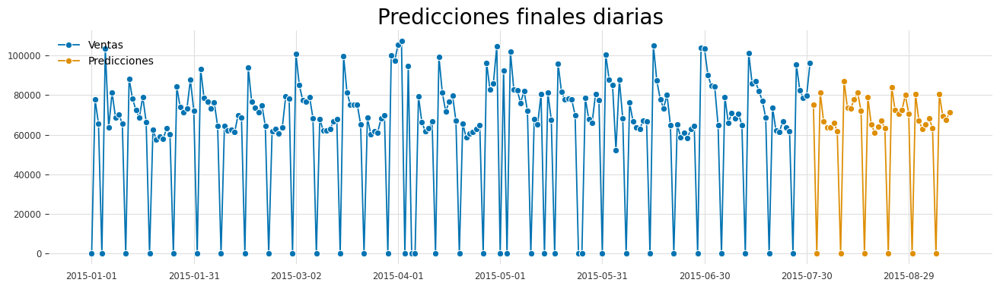

In [167]:
predicciones_plot = pd.DataFrame(preds_tiendas_VAR_definitivas["Total"])
total_group_plot = total_group.copy()
total_group_plot = total_group_plot.set_index("Date").to_period('d')
fig, ax = plot_series(total_group_plot["2015-01-01":], predicciones_plot, labels=["Ventas", 'Predicciones'])

ax.legend(loc='upper left')
plt.title("Predicciones finales diarias",fontsize=20);

# 6. Predecir las ventas totales semanales.

In [169]:
test_tiendas_VAR_total_semanal=tests_tiendas_VAR_total.resample('w').sum()
preds_tiendas_VAR_total_semanal=preds_tiendas_VAR_total.resample('w').sum()

In [170]:
MAPE_VAR_txx_sem =mean_absolute_percentage_error(test_tiendas_VAR_total_semanal, preds_tiendas_VAR_total_semanal)
MSE_VAR_txx_sem =mse(test_tiendas_VAR_total_semanal, preds_tiendas_VAR_total_semanal)
RMSE_VAR_txx_sem =rmse(test_tiendas_VAR_total_semanal, preds_tiendas_VAR_total_semanal)
MAPE_VAR_txx_sem

0.05845086218723692

In [171]:
preds_tiendas_VAR_definitivas_semanales = preds_tiendas_VAR_definitivas.resample('w').sum()

In [172]:
preds_tiendas_VAR_definitivas.to_excel("/Users/juan/Documents/Juan's MacBook Pro/CUNEF/Quinto/Analisis Predictivo/Final/Predicciones_Diarias.xlsx")

# Extra 6 VAR semanal

In [175]:
faltantes_semanal = faltantes.copy()
faltantes_semanal = faltantes_semanal.set_index('Date')
faltantes_semanal = faltantes_semanal.groupby('Store').resample('w').sum()
faltantes_semanal = faltantes_semanal.reset_index().sort_values(by=['Date'])
#faltantes_semanal.head(50)

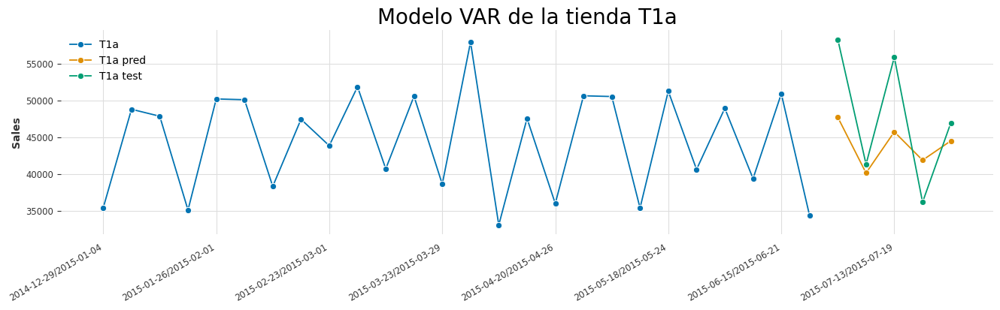

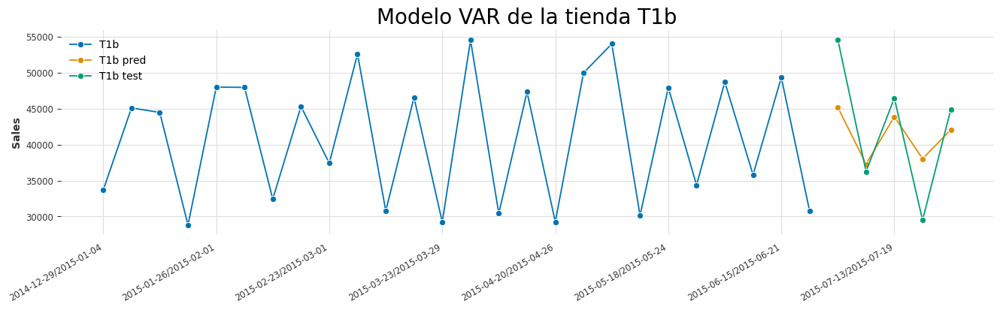

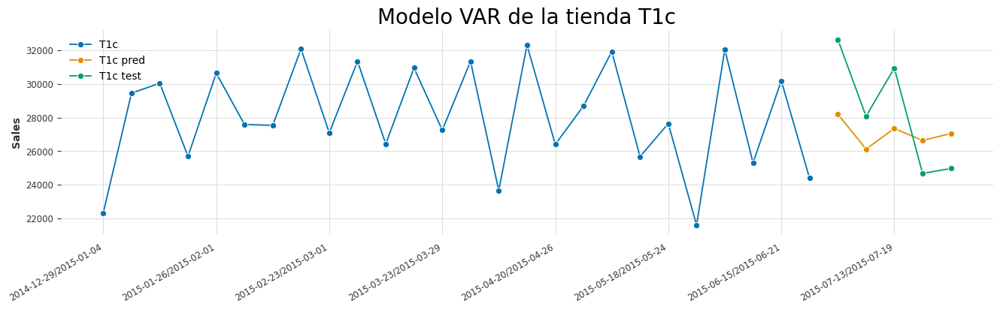

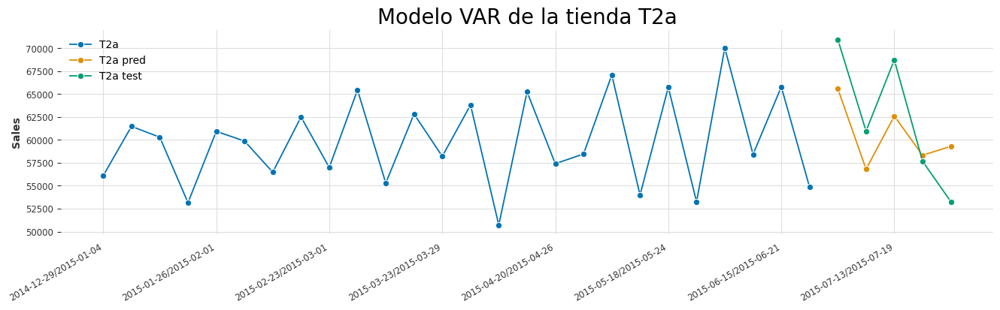

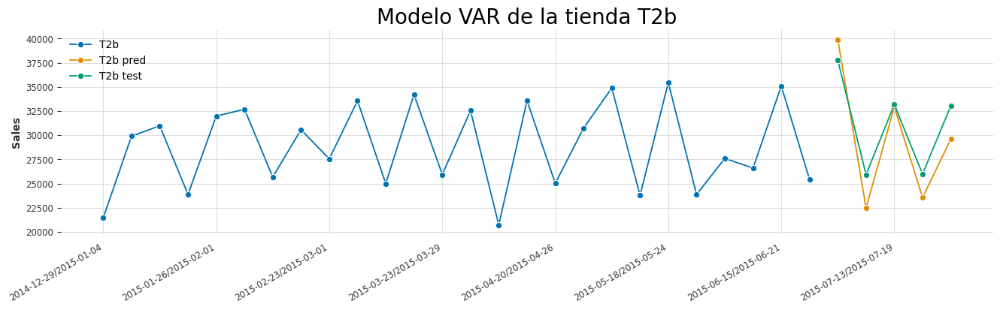

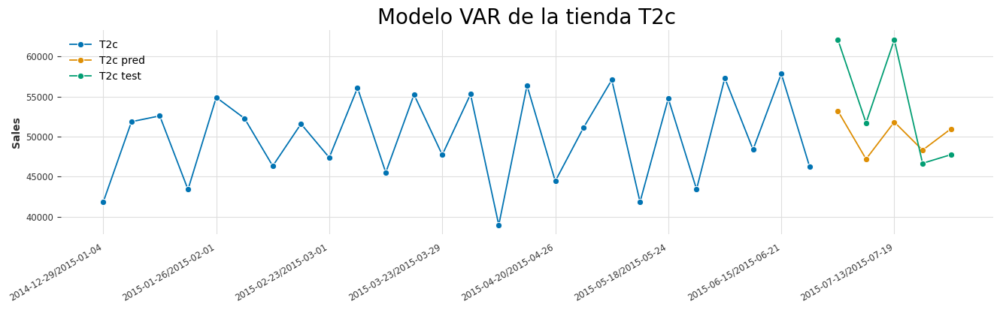

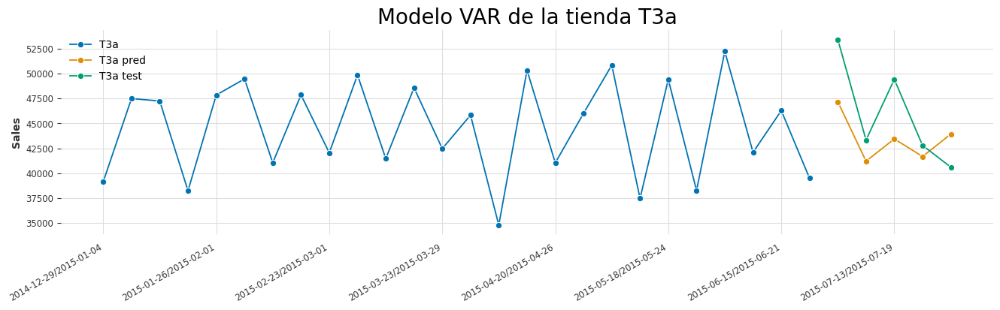

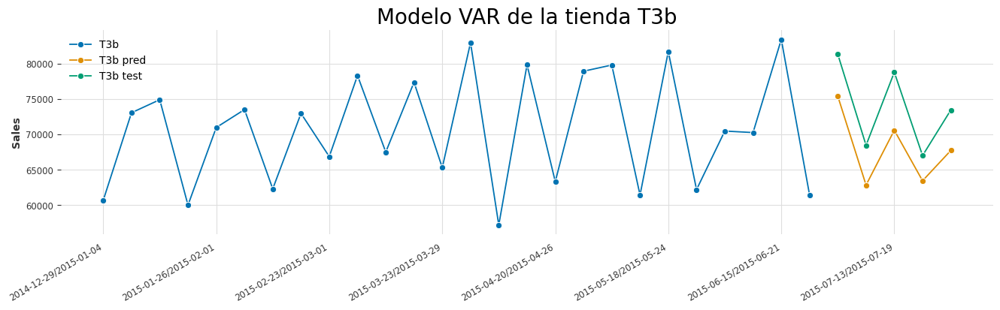

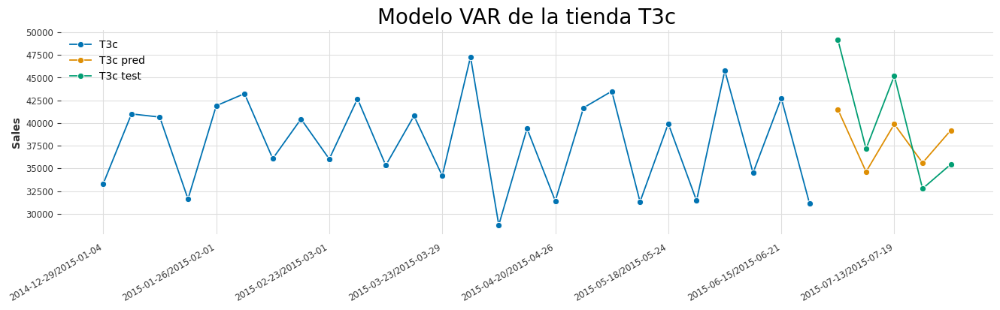

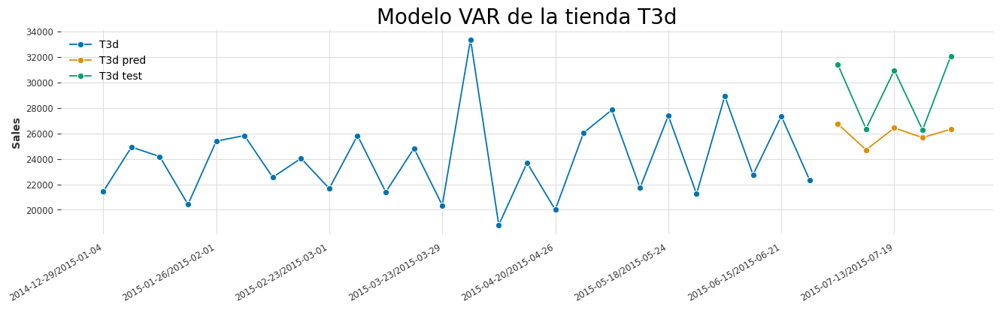

In [176]:
preds_tiendas_VAR = pd.DataFrame()
tests_tiendas_VAR = pd.DataFrame() 

for store in sorted(faltantes_semanal["Store"].unique()):
   
    
    data_txx_VAR = faltantes_semanal[faltantes_semanal['Store'] == store]
    data_txx_VAR = data_txx_VAR[(['Date','Sales','Customers'])]
    data_txx_VAR = data_txx_VAR.fillna(1)
    data_txx_VAR = data_txx_VAR.set_index('Date')
    if store=='T1c':
        data_txx_var_train = data_txx_VAR.loc['2013-07-08':'2015-06-30'].to_period('w')
        data_txx_var_test = data_txx_VAR.loc['2015-07-01':].to_period('w')
    else:
        data_txx_var_train = data_txx_VAR.loc[:'2015-06-30'].to_period('w')
        data_txx_var_test = data_txx_VAR.loc['2015-07-01':].to_period('w')

    var_txx = VAR(data_txx_var_train)
    var_txx.select_order(12)
    results_var_txx = var_txx.fit(maxlags=12, ic='aic')

    lag_order_txx=results_var_txx.k_ar
    f_data_txx=results_var_txx.forecast(data_txx_var_train.values[-lag_order_txx:],5)
    data_fore_txx=pd.DataFrame(f_data_txx)
    data_fore_txx.index=data_txx_var_test.index
    data_fore_txx.rename(columns={0: 'Sales', 1: 'Customers'}, inplace=True)

    data_fore_txx['Sales'] = np.where((data_fore_txx.Sales < 2000), 0, data_fore_txx.Sales)
    
    preds_tiendas_VAR[store] = np.where((data_fore_txx.Sales < 2000), 0, data_fore_txx.Sales)
    tests_tiendas_VAR[store] = data_txx_var_test["Sales"]

    fig, ax = plot_series(data_txx_var_train['Sales']['2015-01-01':],
                          data_fore_txx['Sales'],
                          data_txx_var_test['Sales'],
                          labels=[store, str(store + " pred"), str(store + " test")])
    fig.autofmt_xdate()
    ax.legend(loc='upper left')
    plt.title("Modelo VAR de la tienda " + store,fontsize=20);

In [177]:

tests_tiendas_VAR_total = tests_tiendas_VAR.sum(axis=1)
preds_tiendas_VAR_total = preds_tiendas_VAR.sum(axis=1)
MAPE_VAR_txx =mean_absolute_percentage_error(tests_tiendas_VAR_total, preds_tiendas_VAR_total)
MSE_VAR_txx =mse(tests_tiendas_VAR_total, preds_tiendas_VAR_total)
RMSE_VAR_txx =rmse(tests_tiendas_VAR_total, preds_tiendas_VAR_total)
MAPE_VAR_txx

0.0660291742667047